In [1]:
from __init__ import DATASET_PATH

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import mean_squared_error, mean_absolute_error, root_mean_squared_error
from tqdm import tqdm

from sklearn.preprocessing import RobustScaler
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import PowerTransformer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, KNNImputer, IterativeImputer
from sklearn.model_selection import cross_val_score, cross_validate, cross_val_predict
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import RepeatedKFold

from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.inspection import permutation_importance
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score
from sklearn.metrics import PredictionErrorDisplay
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import OneHotEncoder
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor

from sklearn.svm import SVR

from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import SelectKBest, r_regression, f_regression, mutual_info_regression, RFECV



from main.components.scaler import Scaler
from main.components.imputer import Imputer
from main.components.one_hot_encoder import CustomOneHotEncoder
from main.constants import CATEGORICAL_ATTRIBUTES, CONTINUOUS_ATTRIBUTES, IGF, IGF, VITAMINE_D, PCO, inflammatory_attributes, igf_associated_features
from main.components.preprocessing_methods import remove_outliers, get_continuous_attributes_except, explore_all_variations_of_preprocessing
from main.components.hyperparameter_tuning_methods import hyperparameter_tuning_general, hyperparameter_tuning_linear, compare_random_states, train_model
from main.components.feature_importance_methods import get_feature_importance_lasso, get_feature_importance_tree, get_feature_importance_rf, get_feature_importance_knn, rename_importnace_col, merge_feature_importances, rank_importances, feature_selection_mutual_info_regression, recursive_feature_elimination, get_permutation_importance



import nest_asyncio
nest_asyncio.apply()

pd.set_option('display.max_columns', None) # enable showing all columns of the df
pd.set_option('display.max_rows', None)
pd.set_option("display.expand_frame_repr", True)
pd.set_option('display.width', 1000)
pd.set_option('display.max_colwidth', None)


In [2]:
dataset_file_path = DATASET_PATH
raw_df = pd.read_csv(dataset_file_path)
raw_df.sample(5)

,"PCO 0-healthy control, 1-PCOS, 2-FHA 3-POF, 4-High Andro",IGF-1 ng/ml (N: 100-311),proBNP,"AMH (ng/ml) *7,14=pmol/l",weight,height (cm),BMI,systolic BP (ciśnienie skurczowe),diastolic BP (ciśnienie rozskurczowe),Hypertension,Waist Circumference (WC),WC>88,Hip Circumference (HC),WHR (Waist/Hip ratio),"WHR>0,85 (WHO)","WHR>0,8 (NIDDK)",WHTR (Waist/Height Ratio),"WHTR>0,5","overweight/obesity 0-normal/low, 1-overweight, 2-obesity","irregular cycles (0-nie, 1-tak)","ovulation (0-brak, 1-obecna)","PCO ovary morfology in USG (0-brak, 1--obecna)","stromal hypertrophy in ovary (0-brak, 1-obecny)",acne,hirsutism,FG score (Ferriman-Gallway score - stopień androgenizacji),hyperandrogenism,elevated DHT,hypothyroidism,Volume of the thyroid Right Lobe,Volume of the thyroid Left Lobe,thyroid volume,"nodules 0-lack, 1-RL, 2-LL, 3-both",chronic thyroiditis,Vole of the Right Ovary,Volume of the Left Ovary,ovaries volume - total,follicules >12,WBC x10^3/ul,neutrophil x10^3/ul,lymphocytes x10^3/ul,monocytes x10^3/ul,eosinocytes x10^3/ul,basophils x10^3/ul,% neutrophil,% lymphocytes,% monocytes,%eosinocytes,%basophils,RBC x10^6ul,Hemoglobin [g/dl],hematocrit [%],HTC/Hb,MCV fl,MCH pg,MCHC g/dl,RDW-CV %,PLT x10^3/ul,PDW fl,MPV fl,P-LCR %,PLT/WBC,MPV/PLT,PLR,limf/mono,NLR (stosunek neutrofili do limfocytów),L/WCC (leukocyty do całkowitej liczby krwinek białych),eos/leukocyty,sodium mmol/l,potassium mmol/l,calcium mg/dl,phosphorus mg/dl,creatinine mg/dl,CRP mg/l,ALT U/l,AST U/l,Bilirubin mg/dl,CHOL mmol/l,CHOL>200,HDL mmol/l,HDL<50,LDL mmol/l,LDL>135,TG mmol/l,Atherogenic index (AI) (LDL-C/HDL-C),coronary risk index (CRI) (TG/HDL-C),VAI - Visceral adiposity index,BAI - Body adiposity index,LAP INDEX - Lipid accumulation product index,TyG Index - Trigliceride-glucose index,AIP -Atherogenic index of plasma,UIBC ug/dl,ferrum ug/dl,TIBC,TSAT,ferritin ng/ml,glucose 0 mg/dl,glucose 120 mg/dl,insulin 0 uU/ml,Insulin 120 uU/ml,HOMA,Matsuda,"QUICKI (N<0,357)",TSH mIU/L,FT3 pmol/l,FT4 pmol/l,Anty-TPO IU/ml,Anty-TG IU/ml,FSH mlU/ml,LH,LH/FSH,prolactin,DHEA-S ug/dl,testosterone nmol/l,T (ng/ml),T/SHBG,E(pg/ml)/T(ng/ml)/,Parathormone pg/ml,cortisol nmol/l 8:00,cortisol nmol/l 18:00,Estradiol pg/ml,SHBG nmol/l,SHBG>110,FTI (free testosterone index),ACTH pg/ml,HbA1c %,vitamin 25-OH D ng/ml,Androstendione ng/ml,17-OH-progesterone ng/ml,Dihydrotestosterone pg/ml (N<368),Testosterone/DHT,T/A (testosterone/androstendione),age
638,1,156.0,NaN,NaN,89.0,172.0,30.083829,143.0,87.0,1.0,90.0,1.0,96.0,0.937500,1.0,1.0,0.523256,1.0,2.0,1.0,0.0,1.0,1.0,1.0,1.0,10.0,1.0,NaN,1.0,3.808000,2.35950,6.167500,0.0,1.0,8.34,8.63,16.97,1.0,10.39,7.01,2.64,0.59,0.10,0.05,67.4,25.4,5.7,1.0,0.5,4.57,13.3,40.9,3.075188,89.5,23.1,32.5,12.1,469.0,12.5,10.3,27.7,45.139557,0.021962,177.651515,4.474576,2.655303,0.254090,0.009625,143.0,4.48,10.29,NaN,0.72,NaN,20.0,17.0,NaN,3.80142,0.0,1.08612,1.0,2.053284,0.0,1.50157,1.890476,3.166667,2.498868,37.813953,48.05024,4.711474,0.500602,NaN,NaN,NaN,NaN,NaN,93.0,115.0,21.50,131.00,4.937037,2.51,0.302946,2.33,4.84,16.80,NaN,NaN,9.6,15.0,1.562500,546.0,785.0,3.60,1.037464,0.145161,32.772222,NaN,457.0,209.0,34.0,24.8,0.0,14.40,48.70,NaN,NaN,8.00,13.02,745.0,0.004832,0.450000,20.0
412,1,159.0,17.43,7.484594,55.0,172.0,18.591130,124.0,68.0,0.0,62.0,0.0,92.0,0.673913,0.0,0.0,0.360465,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,5.0,1.0,1.0,0.0,3.412500,2.28800,5.700500,0.0,0.0,9.88,15.92,25.80,1.0,5.09,2.82,1.88,0.31,0.05,0.03,55.4,36.9,6.1,1.0,0.6,4.81,14.0,41.2,2.942857,85.7,29.1,61.0,12.8,173.0,12.8,10.5,29.1,33.988212,0.060694,92.021277,6.064516,1.500000,0.369352,0.009823,142.0,4.12,9.91,4.02,0.88,0.4,32.0,22.0,1.04,4.99098,0.0,2.27568,0.0,2.182584,0.0,1.18545,0.959091,1.193182,0.845082,35.488372,4.74180,4.559934,0.076707,132.0,150.0,282.0,53.0,59.0,87.0,92.0,9.06,38.16,1.946222,6.01,0.345227,2.50,5.06,15.43,6.0,12.0,8.2,11.6,1.414634,363.0,273.0,1.80,0.518732,0.027314,82.894444,40.62,397.0,247.0,43.0,65.9,0.0,2.65,26.51,5.0,21.0,4.65,2.97,375.0,0.004800,0.387097,20.0


Left only the values within the interval: [-11.26, 499.68]
Removed 8 outlier values of IGF-1 ng/ml (N: 100-311) -> 1.26 % of all the not null examples


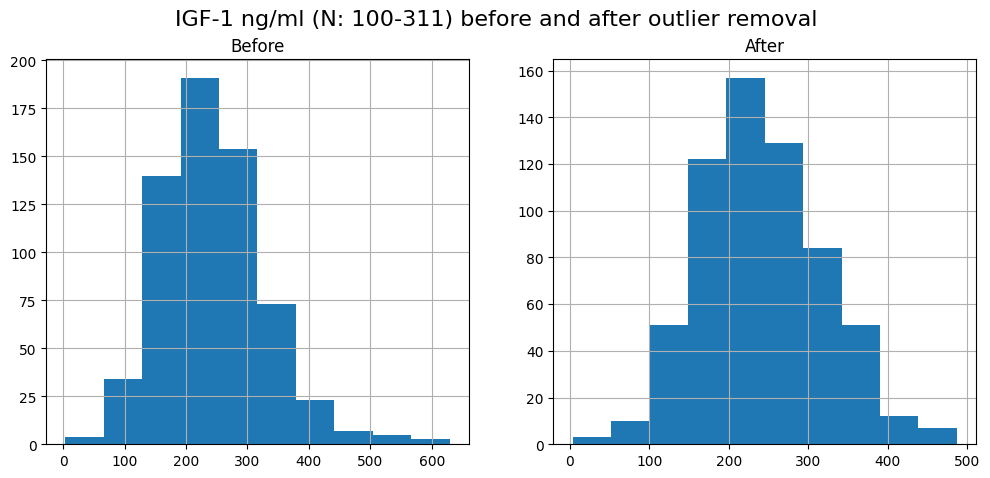

In [3]:
df = remove_outliers(raw_df, IGF)

In [4]:
df_igf_cleaned = df.dropna(subset=[IGF])

X_igf, y_igf = df_igf_cleaned.drop(columns=[IGF]), df_igf_cleaned[IGF]
X_train_igf, X_test_igf, y_train_igf, y_test_igf = train_test_split(X_igf, y_igf, test_size=0.2, random_state=42)

In [6]:

from sklearn.discriminant_analysis import StandardScaler
from sklearn.preprocessing import MinMaxScaler


continuous_preprocessor_tree_hyperparam_tuning = Pipeline([('imputer', KNNImputer(n_neighbors=10))])
continuous_preprocessor_tree = Pipeline([('imputer',  IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))])


continuous_preprocessor_hyperparam_tuning = Pipeline([('scaler', StandardScaler()), ('imputer', KNNImputer(n_neighbors=10))])
continuous_preprocessor =  Pipeline([('scaler', StandardScaler()), ('imputer', IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))])


categorical_preprocessor = Pipeline([
    ('imputer', IterativeImputer(estimator=KNeighborsClassifier(n_neighbors=10, n_jobs=-1), max_iter=40, initial_strategy='most_frequent')),
    ('one_hot_encoder', OneHotEncoder(handle_unknown='error', drop='if_binary'))
    ])

## Models exploration

In [17]:



models = [
        LinearRegression(),
        Lasso(),
        Ridge(),
        KNeighborsRegressor(),
        ]


continuous_preprocessings = {
    # 'Min Max': Pipeline([('scaler', MinMaxScaler()), ('imputer', KNNImputer(n_neighbors=10))]),
    # 'Standard Scaler': Pipeline([('scaler', StandardScaler()), ('imputer', KNNImputer(n_neighbors=10))]),
    # 'Power Transformer': Pipeline([('scaler', PowerTransformer()), ('imputer', KNNImputer(n_neighbors=10))]),
    
    'Min Max': Pipeline([('scaler', MinMaxScaler()), ('imputer', IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))]),
    'Standard Scaler': Pipeline([('scaler', StandardScaler()), ('imputer', IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))]),
    'Power Transformer': Pipeline([('scaler', PowerTransformer()), ('imputer', IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))]),
}

categorical_preprocessings = {
    'ii_imputer': Pipeline([('imputer', IterativeImputer(estimator=KNeighborsClassifier(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='most_frequent')), ('one_hot_encoder', OneHotEncoder(handle_unknown='error', drop='if_binary'))]),
}


scores_df = explore_all_variations_of_preprocessing(X_train_igf, y_train_igf, IGF, models, continuous_preprocessings, categorical_preprocessings)
scores_df.sort_values(by='neg_mean_absolute_error', ascending=True)

1/12 LinearRegression() Min Max ii_imputer [-7.30875000e+01 -6.27025000e+01 -6.27332938e+01 -7.29875000e+01
 -7.04125000e+01 -7.81100000e+01 -1.09468995e+10 -6.77600000e+01
 -6.37975000e+01 -7.31587500e+01 -8.80656250e+01 -6.64450000e+01
 -6.89050000e+01 -7.32478250e+01 -6.82137500e+01] 729793368.8006797
2/12 Lasso() Min Max ii_imputer [-59.03630806 -56.71361937 -55.7084863  -52.56177341 -57.37330378
 -56.28466381 -58.15853621 -53.86483373 -53.90778813 -58.91530204
 -53.47133906 -49.54602408 -56.06582805 -63.85142254 -57.68903728] 56.209884390439534
3/12 Ridge() Min Max ii_imputer [-64.61679557 -58.86313922 -54.66848028 -55.88992188 -57.87012607
 -63.03042945 -55.90654395 -51.90828565 -57.03798781 -57.05996814
 -59.84002265 -51.73695119 -54.08752266 -68.13935598 -61.00503245] 58.11070419645276
4/12 KNeighborsRegressor() Min Max ii_imputer [-72.12494 -61.94306 -61.9487  -56.486   -65.03894 -65.88494 -62.5247
 -59.87094 -66.306   -66.802   -59.34    -64.06694 -68.224   -69.6587
 -58.9789

,continuous_preprocessing,categorical_pteprocessing,model,neg_mean_absolute_error
1,Min Max,ii_imputer,Lasso(),5.620988e+01
5,Standard Scaler,ii_imputer,Lasso(),5.690823e+01
11,Power Transformer,ii_imputer,KNeighborsRegressor(),5.734808e+01
9,Power Transformer,ii_imputer,Lasso(),5.767589e+01
7,Standard Scaler,ii_imputer,KNeighborsRegressor(),5.783414e+01
2,Min Max,ii_imputer,Ridge(),5.811070e+01
10,Power Transformer,ii_imputer,Ridge(),6.142583e+01
3,Min Max,ii_imputer,KNeighborsRegressor(),6.394659e+01
6,Standard Scaler,ii_imputer,Ridge(),6.420687e+01
8,Power Transformer,ii_imputer,LinearRegression(),6.472238e+01


## Hyperparameter tuning

### Lasso

Fitting 15 folds for each of 7 candidates, totalling 105 fits


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


Best parameters: {'model__alpha': 2}
Best score (neg_mean_absolute_error): -55.992626848435


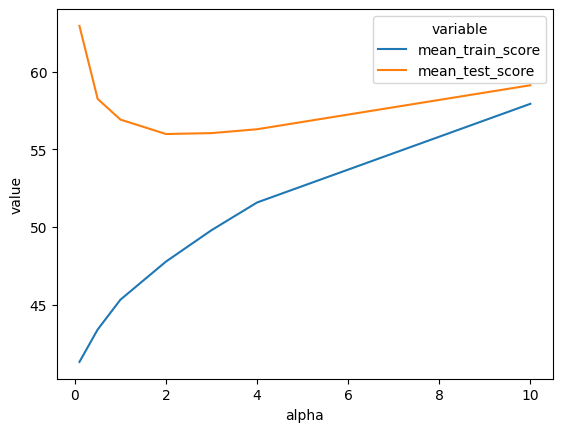

,alpha,mean_train_score,mean_test_score
0,0.1,41.298501,62.961579
1,0.5,43.387408,58.254149
2,1,45.312569,56.922804
3,2,47.769256,55.992627
4,3,49.793265,56.049884
5,4,51.578072,56.300321
6,10,57.939128,59.136441


In [7]:
param_grid_lasso = {
    'model__alpha': [0.1, 0.5, 1, 2, 3, 4, 10],
}

lasso_model_hyperparam_tuning_df = hyperparameter_tuning_linear(X_train_igf, y_train_igf, IGF, Lasso(), continuous_preprocessor, categorical_preprocessor, param_grid_lasso, main_parameter='alpha')
lasso_model_hyperparam_tuning_df

Chosen alpha: 1

### KNN

Fitting 15 folds for each of 7 candidates, totalling 105 fits


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


Best parameters: {'model__n_neighbors': 17}
Best score (neg_mean_absolute_error): -59.01718196078431


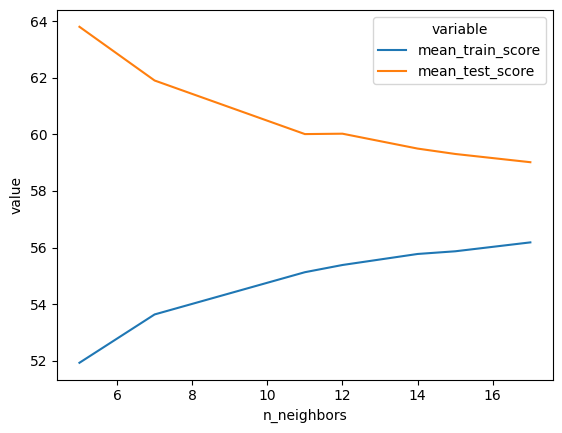

,n_neighbors,mean_train_score,mean_test_score
6,17,56.181569,59.017182
5,15,55.866307,59.308723
4,14,55.771600,59.498970
2,11,55.126825,60.011802
3,12,55.381681,60.025616
1,7,53.632692,61.907113
0,5,51.922899,63.807245


In [12]:
from sklearn.neighbors import KNeighborsRegressor

#  NOTE: selected n_neighbours=7

knn_model = KNeighborsRegressor()

knn_param_grid = {
    'model__n_neighbors': [5, 7, 11, 12, 14, 15, 17],  # Number of neighbors to consider
    # 'model__weights': ['uniform', 'distance'],  # Weight function used in prediction
    # 'model__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],  # Algorithm used to compute the nearest neighbors
    # 'model__leaf_size': [20, 30, 40, 50],  # Leaf size passed to BallTree or KDTree
    # 'model__p': [1, 2]  # Power parameter for Minkowski metric (1 for Manhattan distance, 2 for Euclidean distance)
}

knn_hyperparam_tuning_df = hyperparameter_tuning_linear(X_train_igf, y_train_igf, IGF, knn_model, continuous_preprocessor, categorical_preprocessor, knn_param_grid, main_parameter='n_neighbors')
knn_hyperparam_tuning_df.sort_values(by='mean_test_score')

### Ridge

Fitting 15 folds for each of 8 candidates, totalling 120 fits


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


Best parameters: {'model__alpha': 10}
Best score (neg_mean_absolute_error): -55.324084781472344


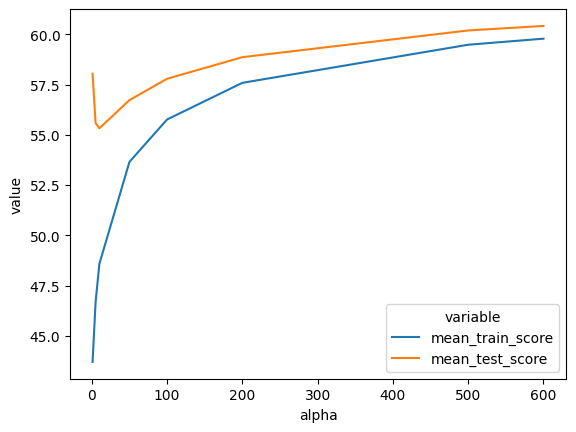

,alpha,mean_train_score,mean_test_score
0,1,43.707592,58.034505
1,5,46.674088,55.588240
2,10,48.578628,55.324085
3,50,53.656125,56.726345
4,100,55.763605,57.788461
5,200,57.585695,58.861545
6,500,59.479938,60.190516
7,600,59.781805,60.415461


In [13]:
param_grid_ridge = {
    "model__alpha": [1, 5, 10, 50, 100, 200, 500, 600],
}

vit_d_ridge_model_hyperparam_tuning_df = hyperparameter_tuning_linear(X_train_igf, y_train_igf, IGF, Ridge(), continuous_preprocessor, categorical_preprocessor, param_grid_ridge, main_parameter='alpha')
vit_d_ridge_model_hyperparam_tuning_df

Chosen alpha: 50

### RandomForest

In [30]:
param_grid_rf = {
    'model__n_estimators': [200],
    'model__max_features': ['sqrt'],
    'model__max_depth': [None],
    'model__min_samples_split': [8, 10, 12],
    'model__min_samples_leaf': [3, 5, 7],
}

tree_model_hyperparam_tuning_df = hyperparameter_tuning_general(X_train_igf, y_train_igf, IGF, RandomForestRegressor(), continuous_preprocessor, categorical_preprocessor, param_grid_rf)
tree_model_hyperparam_tuning_df.sort_values(by='mean_test_score')

Fitting 15 folds for each of 18 candidates, totalling 270 fits


,params,mean_train_mae,mean_test_mae
16,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 7, 'model__min_samples_split': 10, 'model__n_estimators': 200}",41.810143,60.099159
9,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 3, 'model__min_samples_split': 8, 'model__n_estimators': 200}",31.832130,60.177599
1,"{'model__max_depth': 20, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 3, 'model__min_samples_split': 10, 'model__n_estimators': 200}",33.928776,60.182291
10,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 3, 'model__min_samples_split': 10, 'model__n_estimators': 200}",33.874325,60.235325
3,"{'model__max_depth': 20, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 5, 'model__min_samples_split': 8, 'model__n_estimators': 200}",37.041478,60.241482
4,"{'model__max_depth': 20, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 5, 'model__min_samples_split': 10, 'model__n_estimators': 200}",36.968499,60.250744
6,"{'model__max_depth': 20, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 7, 'model__min_samples_split': 8, 'model__n_estimators': 200}",41.863576,60.289191
13,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 5, 'model__min_samples_split': 10, 'model__n_estimators': 200}",36.979434,60.297108
14,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 5, 'model__min_samples_split': 12, 'model__n_estimators': 200}",38.359807,60.302342
5,"{'model__max_depth': 20, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 5, 'model__min_samples_split': 12, 'model__n_estimators': 200}",38.378933,60.303784


In [11]:
rf_model = RandomForestRegressor(n_estimators=200, max_depth=None, max_features='sqrt', min_samples_leaf=7, min_samples_split=10, criterion='absolute_error', random_state=13)

tuned_df = compare_random_states(X_train_igf, y_train_igf, rf_model, IGF, continuous_preprocessor, categorical_preprocessor)
tuned_df.sort_values(by='cv_mae', ascending=False).head(5)

100%|██████████| 99/99 [09:22<00:00,  5.68s/it]


,cv_mae
56,-60.252833
24,-60.319136
71,-60.389253
67,-60.390057
8,-60.415431


### DecisionTreeRegressor

In [10]:
param_grid_tree = {
    "model__criterion": ["squared_error", "absolute_error"],
    "model__max_depth": [5, 7, 10, 15],
    "model__splitter": ["random"],
    "model__min_samples_split": [15, 20, 25, 30],
    "model__min_samples_leaf": [10, 15, 20, 25],
    }

tree_model_hyperparam_tuning_df = hyperparameter_tuning_general(X_train_igf, y_train_igf, IGF, DecisionTreeRegressor(), continuous_preprocessor, categorical_preprocessor, param_grid_tree)
tree_model_hyperparam_tuning_df.sort_values(by='mean_test_score')

Fitting 15 folds for each of 128 candidates, totalling 1920 fits


,params,mean_train_mae,mean_test_mae
60,"{'model__criterion': 'squared_error', 'model__max_depth': 15, 'model__min_samples_leaf': 25, 'model__min_samples_split': 15, 'model__splitter': 'random'}",57.744918,64.820633
12,"{'model__criterion': 'squared_error', 'model__max_depth': 5, 'model__min_samples_leaf': 25, 'model__min_samples_split': 15, 'model__splitter': 'random'}",57.560372,64.921653
124,"{'model__criterion': 'absolute_error', 'model__max_depth': 15, 'model__min_samples_leaf': 25, 'model__min_samples_split': 15, 'model__splitter': 'random'}",56.128836,65.008289
126,"{'model__criterion': 'absolute_error', 'model__max_depth': 15, 'model__min_samples_leaf': 25, 'model__min_samples_split': 25, 'model__splitter': 'random'}",56.347978,65.039668
70,"{'model__criterion': 'absolute_error', 'model__max_depth': 5, 'model__min_samples_leaf': 15, 'model__min_samples_split': 25, 'model__splitter': 'random'}",54.164183,65.175315
105,"{'model__criterion': 'absolute_error', 'model__max_depth': 10, 'model__min_samples_leaf': 20, 'model__min_samples_split': 20, 'model__splitter': 'random'}",54.071129,65.201847
14,"{'model__criterion': 'squared_error', 'model__max_depth': 5, 'model__min_samples_leaf': 25, 'model__min_samples_split': 25, 'model__splitter': 'random'}",58.028373,65.317146
106,"{'model__criterion': 'absolute_error', 'model__max_depth': 10, 'model__min_samples_leaf': 20, 'model__min_samples_split': 25, 'model__splitter': 'random'}",54.157504,65.367604
63,"{'model__criterion': 'squared_error', 'model__max_depth': 15, 'model__min_samples_leaf': 25, 'model__min_samples_split': 30, 'model__splitter': 'random'}",57.440324,65.409121
13,"{'model__criterion': 'squared_error', 'model__max_depth': 5, 'model__min_samples_leaf': 25, 'model__min_samples_split': 20, 'model__splitter': 'random'}",58.314826,65.413862


In [12]:
model = DecisionTreeRegressor(criterion="squared_error", max_depth=15, min_samples_leaf=25, min_samples_split=15, splitter='random')
	
tuned_df = compare_random_states(X_train_igf, y_train_igf, model, IGF, continuous_preprocessor, categorical_preprocessor)
tuned_df.sort_values(by='cv_mae', ascending=False).head(5)

100%|██████████| 99/99 [00:42<00:00,  2.31it/s]


,cv_mae
16,-63.625855
45,-63.926099
81,-64.088162
88,-64.180902
73,-64.462722


## Best models - IGF

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


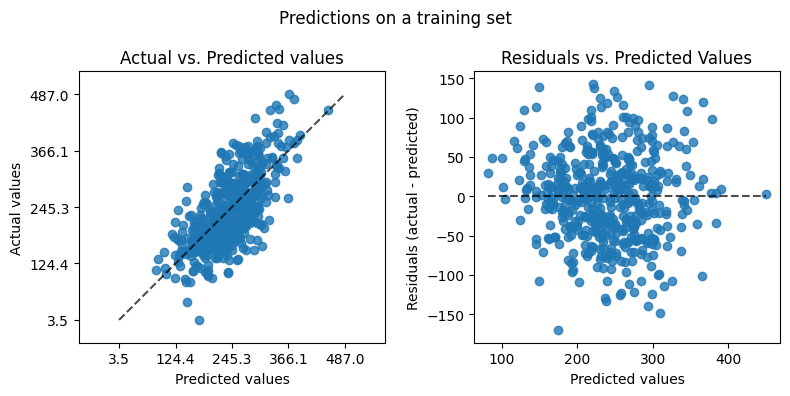

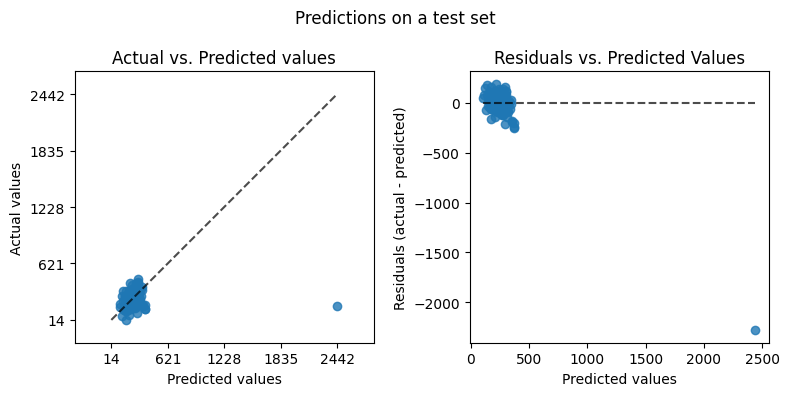

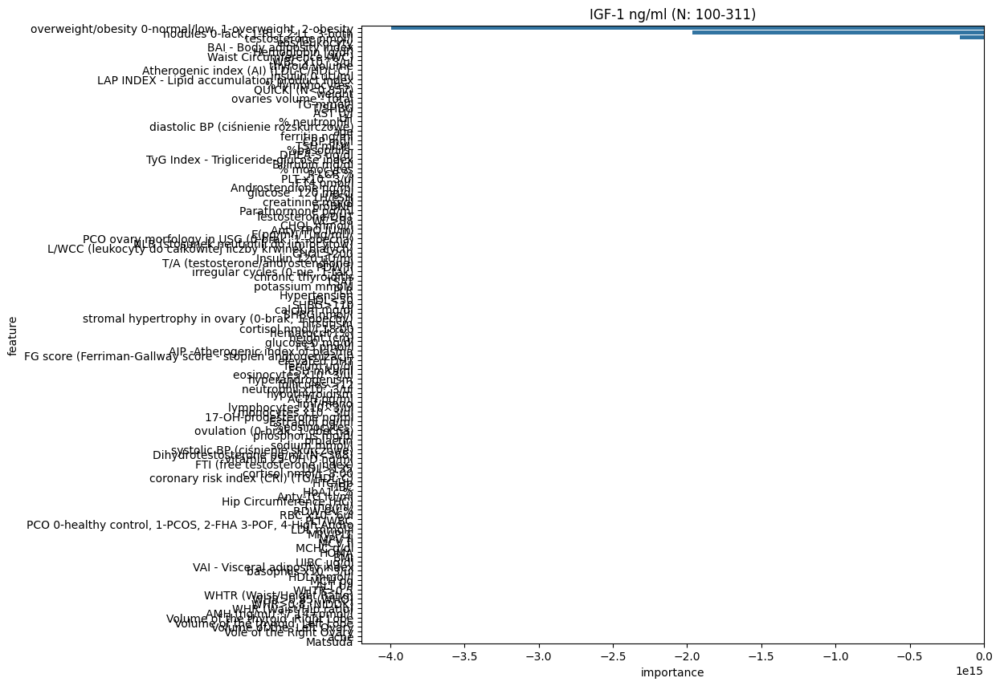

,model,data_set,mse,mae,rmse,r2
0,LinearRegression(),training,3058.840,44.132,55.307,0.483
1,LinearRegression(),test,48790.559,85.046,220.886,-6.208


In [14]:
lr_model = LinearRegression()

vit_d_model_scores_df, feature_importnces_lr = train_model(lr_model, IGF, X_train_igf, y_train_igf, X_test_igf, y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


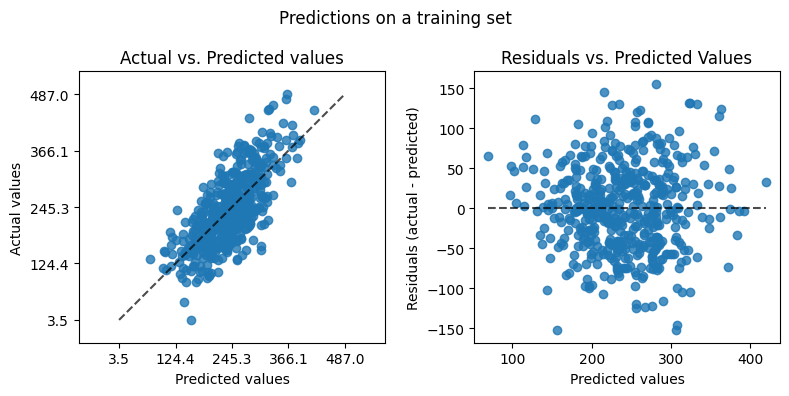

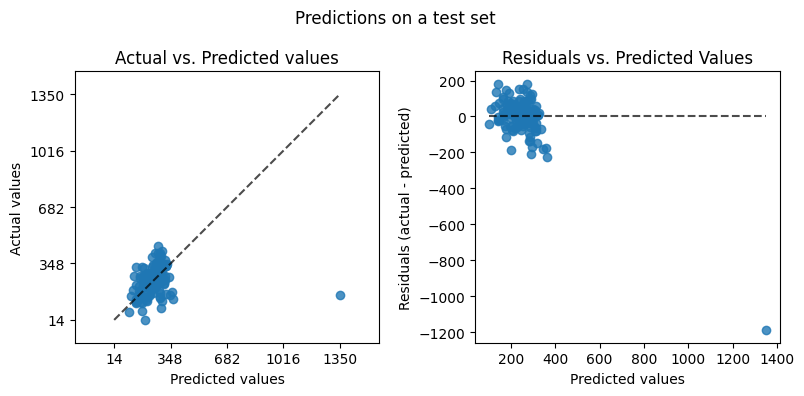

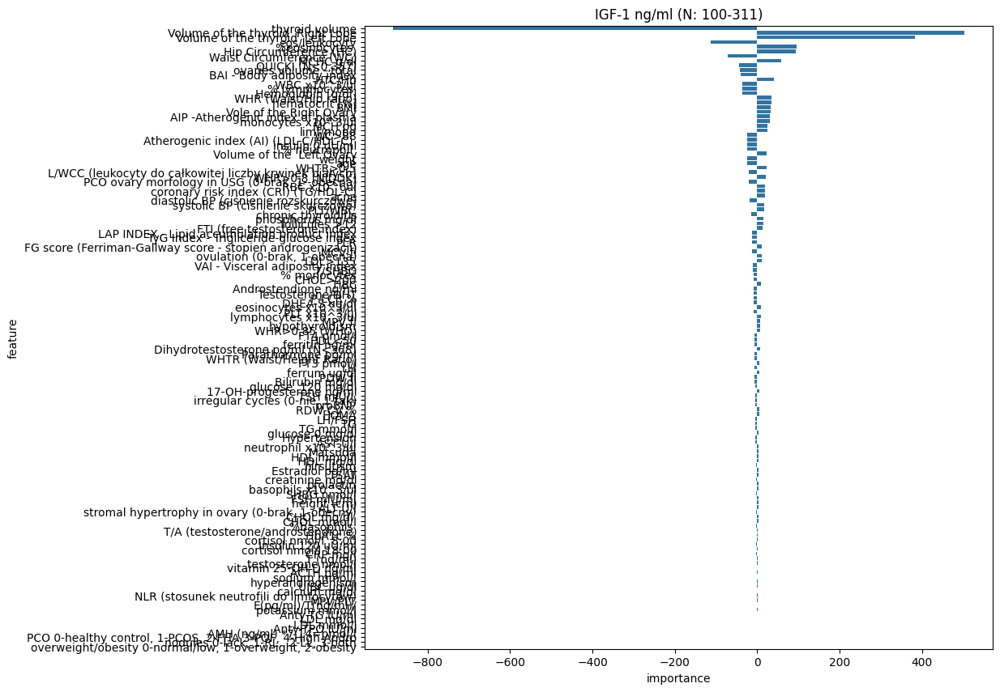

,model,data_set,mse,mae,rmse,r2
0,LinearRegression(),training,2864.264,42.746,53.519,0.516
1,LinearRegression(),test,17644.244,70.916,132.832,-1.607


In [7]:
lr_model = LinearRegression()

vit_d_model_scores_df, feature_importnces_lr = train_model(lr_model, IGF, X_train_igf, y_train_igf, X_test_igf, y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


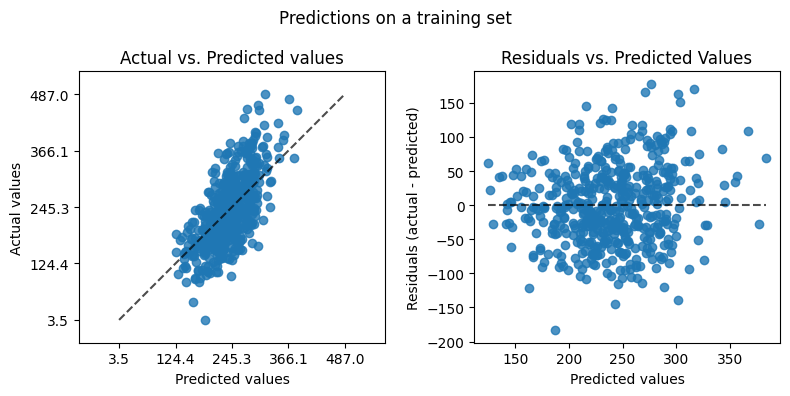

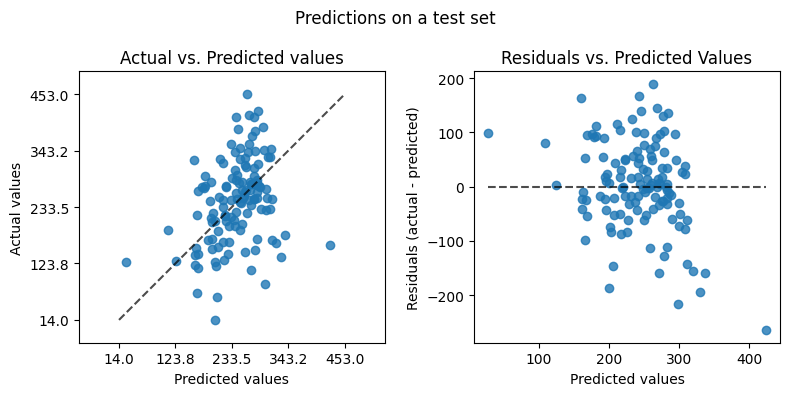

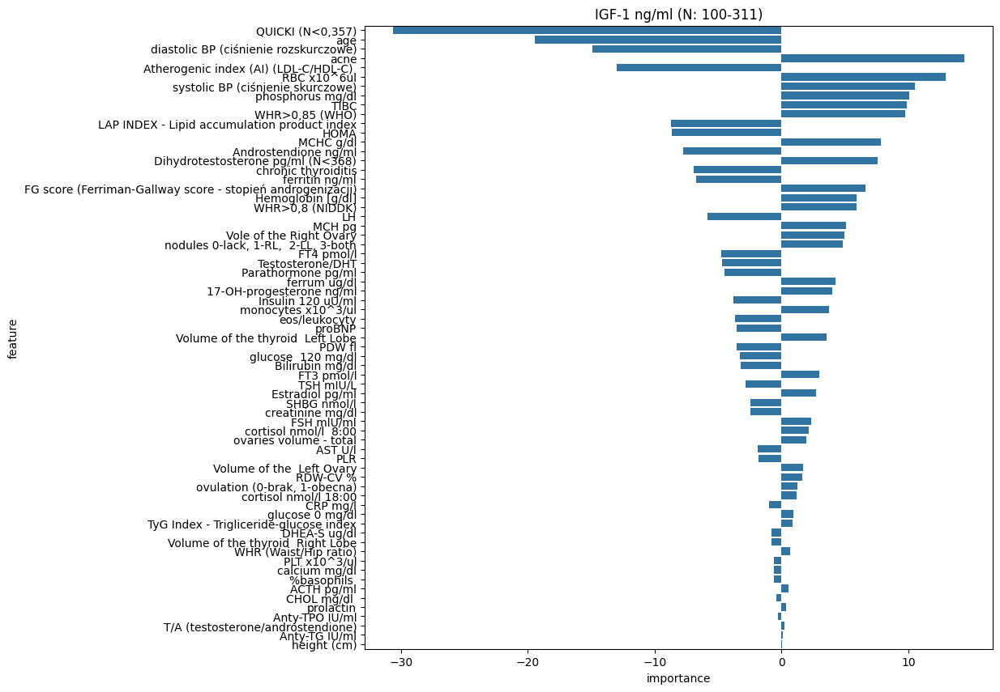

,model,data_set,mse,mae,rmse,r2
0,Lasso(alpha=1),training,3354.589,46.717,57.919,0.433
1,Lasso(alpha=1),test,6676.362,61.961,81.709,0.014


In [8]:
lasso_model = Lasso(alpha=1)

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, IGF, X_train_igf, y_train_igf, X_test_igf, y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


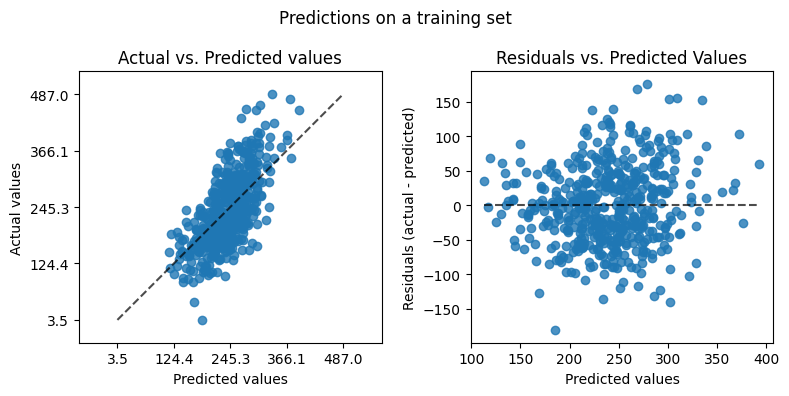

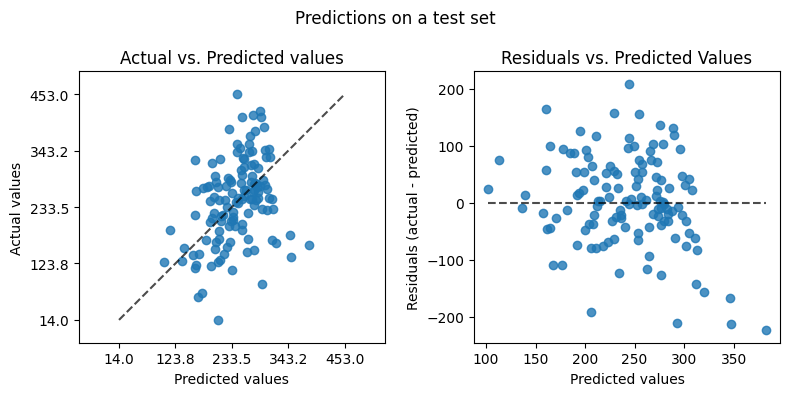

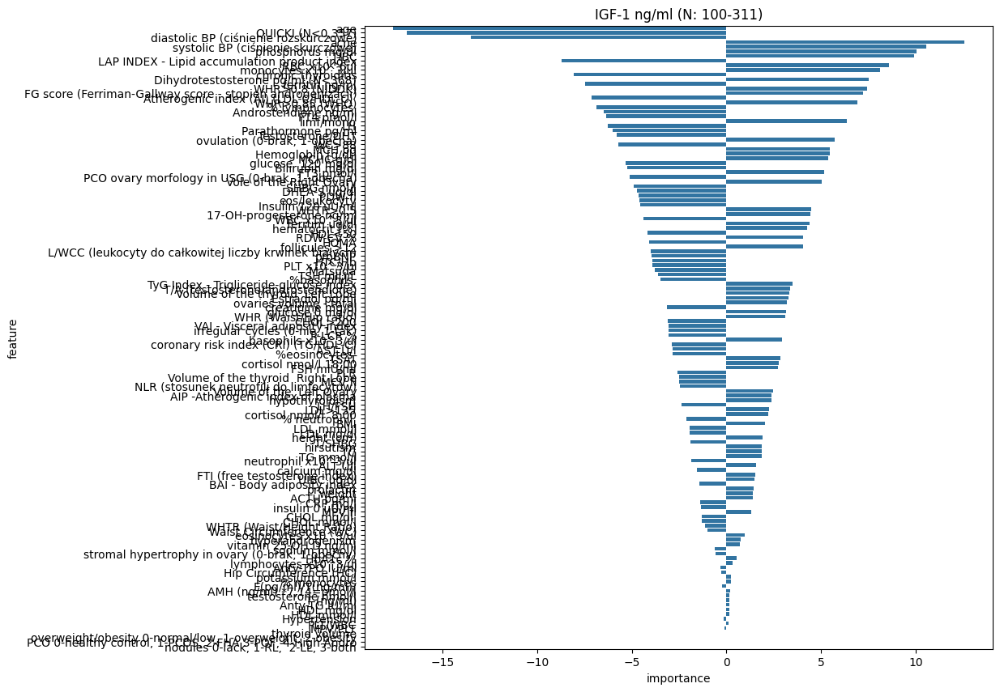

,model,data_set,mse,mae,rmse,r2
0,Ridge(alpha=50),training,3194.987,45.470,56.524,0.460
1,Ridge(alpha=50),test,6395.880,61.348,79.974,0.055


In [9]:
ridge_model = Ridge(alpha=50)

vit_d_model_scores_df, feature_importnces_ridge = train_model(ridge_model, IGF, X_train_igf, y_train_igf, X_test_igf, y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


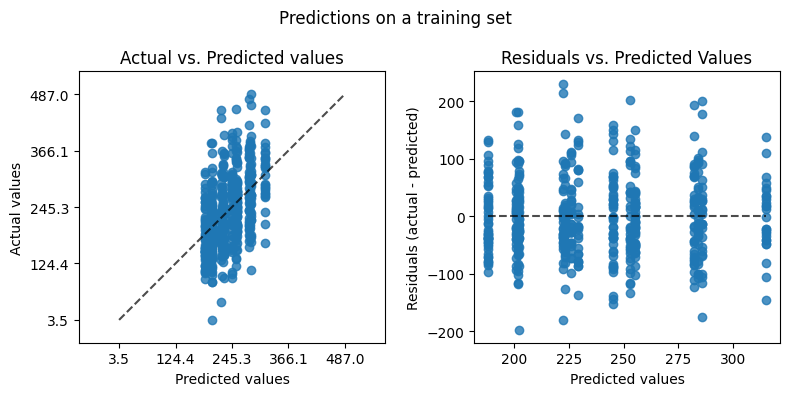

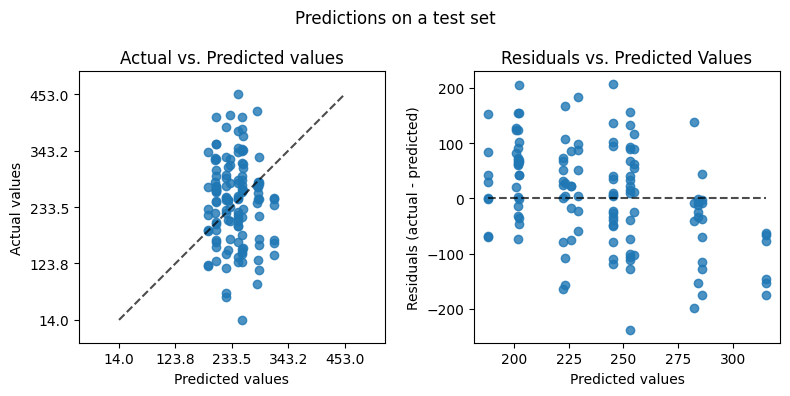

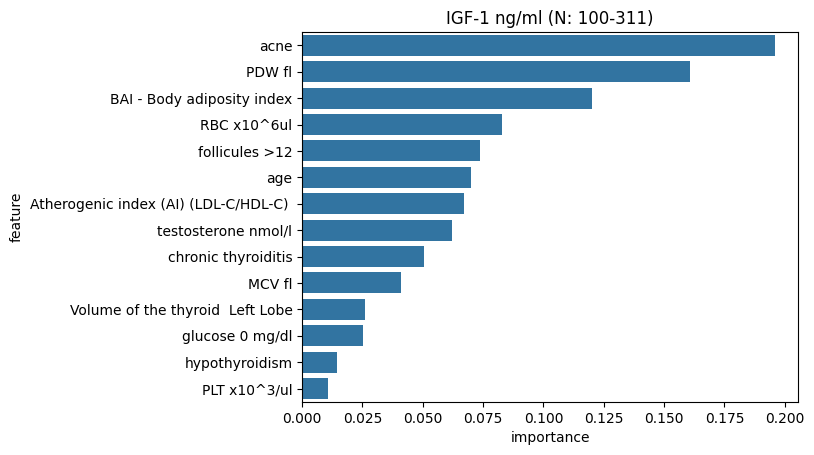

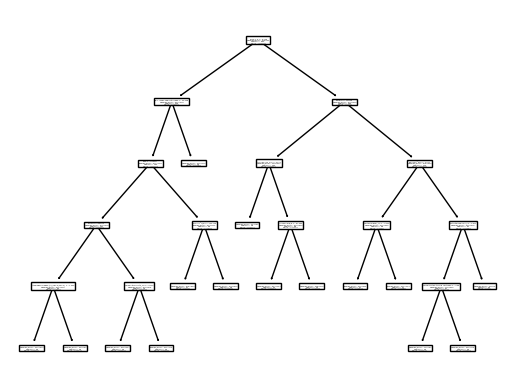

,model,data_set,mse,mae,rmse,r2
0,"DecisionTreeRegressor(max_depth=15, min_samples_leaf=25, min_samples_split=15,\n random_state=16, splitter='random')",training,4662.627,53.875,68.283,0.212
1,"DecisionTreeRegressor(max_depth=15, min_samples_leaf=25, min_samples_split=15,\n random_state=16, splitter='random')",test,8219.034,72.604,90.659,-0.214


In [10]:
tree_model = DecisionTreeRegressor(criterion="squared_error", max_depth=15, min_samples_leaf=25, min_samples_split=15, splitter='random', random_state=16)
vit_d_model_scores_df, feature_importnces_tree = train_model(tree_model, IGF, X_train_igf, y_train_igf, X_test_igf, y_test_igf, tree_continuous_preprocessor, categorical_preprocessor, get_feature_importance_tree)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


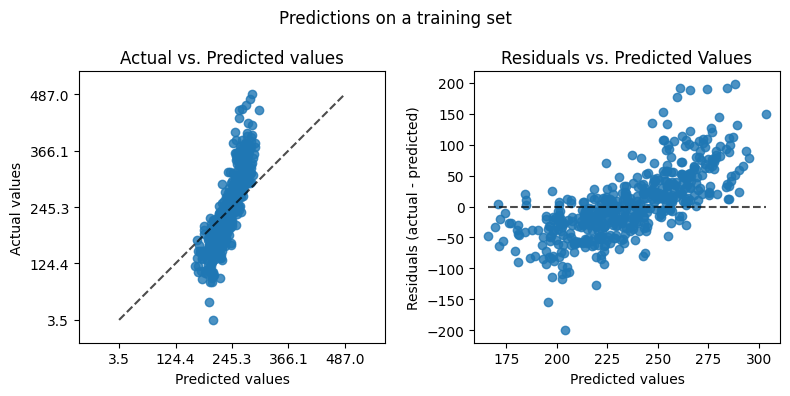

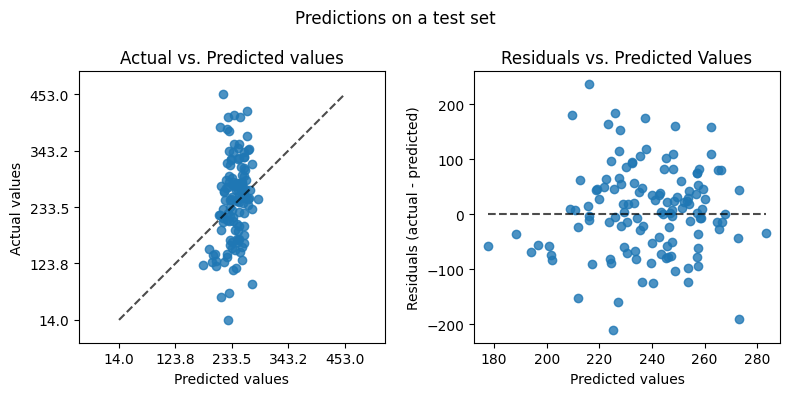

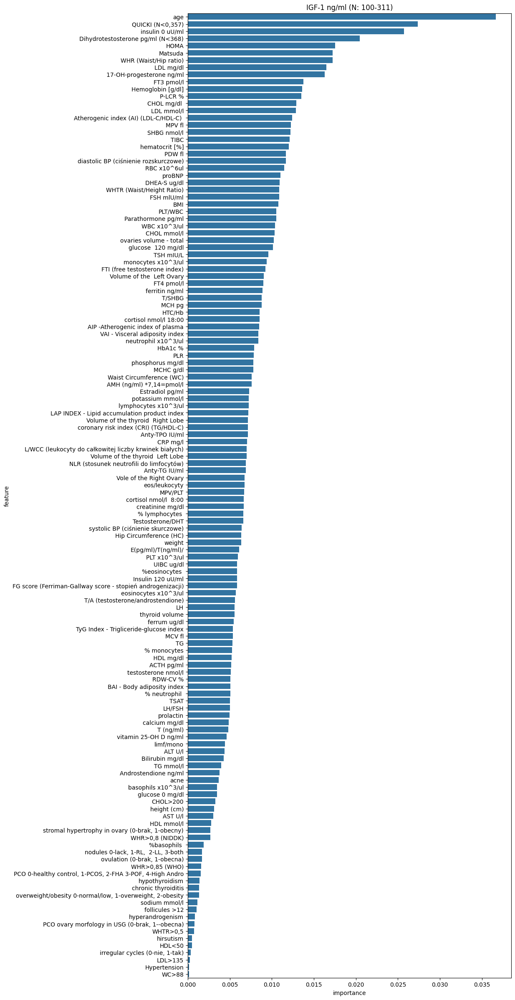

,model,data_set,mse,mae,rmse,r2
0,"RandomForestRegressor(criterion='absolute_error', max_features='sqrt',\n min_samples_leaf=7, min_samples_split=10,\n n_estimators=200, random_state=56)",training,3015.549,41.481,54.914,0.491
1,"RandomForestRegressor(criterion='absolute_error', max_features='sqrt',\n min_samples_leaf=7, min_samples_split=10,\n n_estimators=200, random_state=56)",test,6320.412,61.932,79.501,0.066


In [11]:
rf_model = RandomForestRegressor(n_estimators=200, max_depth=None, max_features='sqrt', min_samples_leaf=7, min_samples_split=10, criterion='absolute_error', random_state=56)

vit_d_model_scores_df, feature_importnces_rf = train_model(rf_model, IGF, X_train_igf, y_train_igf, X_test_igf, y_test_igf, tree_continuous_preprocessor, categorical_preprocessor, get_feature_importance_rf)
vit_d_model_scores_df

## Best models on subsets of data

In [6]:
index_features = [
    'LAP INDEX - Lipid accumulation product index',
    'VAI - Visceral adiposity index',
    'BAI - Body adiposity index',
    'TyG Index - Trigliceride-glucose index',
    'AIP -Atherogenic index of plasma',
    'Atherogenic index (AI) (LDL-C/HDL-C) ',
    'coronary risk index (CRI) (TG/HDL-C)',
    'FTI (free testosterone index)',
]



In [8]:
def difference_of_sets(set1, set2):
    return set(set1) - set(set2)

featureset_variations = {}

# without the obviously related features
cropped_featureset = list(difference_of_sets(X_igf.columns, igf_associated_features))
featureset_variations['cropped'] = cropped_featureset

#  inflammatory attributes
# inflammatory_featureset = difference_of_sets(inflammatory_attributes, igf_associated_features)
# featureset_variations['inflammatory'] = inflammatory_featureset

# #  carbohydrate metabolism attributes
# index_featureset = difference_of_sets(index_features, igf_associated_features)
# featureset_variations['index'] = index_featureset

In [9]:

# Definicja modelu SVR z jądrem rbf
svr_model = SVR(kernel='rbf')

# Definicja siatki parametrów
svr_param_grid = {
    'model__C': [0.1, 1, 10, 100],  # Parametr regularizacji
    'model__gamma': [0.001, 0.01, 0.1, 1],  # Współczynnik gamma w funkcji jądra rbf
    'model__epsilon': [0.01, 0.1, 0.2, 0.5]  # Szerokość rury epsilon
}

# Przeprowadzenie strojenia hiperparametrów
svr_hyperparam_tuning_df = hyperparameter_tuning_general(X_train_igf[index_features], y_train_igf, IGF, svr_model, continuous_preprocessor, categorical_preprocessor, svr_param_grid)

# Sortowanie wyników według mean_test_score
svr_hyperparam_tuning_df.sort_values(by='mean_test_score').head()

Fitting 15 folds for each of 64 candidates, totalling 960 fits
Best parameters: {'model__C': 100, 'model__epsilon': 0.01, 'model__gamma': 0.01}
Best score (neg_mean_absolute_error): -59.33817750902772


,params,mean_train_score,mean_test_score
49,"{'model__C': 100, 'model__epsilon': 0.01, 'model__gamma': 0.01}",57.280290,59.338178
57,"{'model__C': 100, 'model__epsilon': 0.2, 'model__gamma': 0.01}",57.284409,59.338317
53,"{'model__C': 100, 'model__epsilon': 0.1, 'model__gamma': 0.01}",57.282608,59.338956
61,"{'model__C': 100, 'model__epsilon': 0.5, 'model__gamma': 0.01}",57.287514,59.340491
42,"{'model__C': 10, 'model__epsilon': 0.2, 'model__gamma': 0.1}",57.252094,59.680115


In [ ]:
knn_model = KNeighborsRegressor()

knn_param_grid = {
    'model__n_neighbors': [5, 7, 8, 9, 10, 11, 12, 14, 15, 17],  # Number of neighbors to consider
    # 'model__weights': ['uniform', 'distance'],  # Weight function used in prediction
    # 'model__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],  # Algorithm used to compute the nearest neighbors
    # 'model__leaf_size': [20, 30, 40, 50],  # Leaf size passed to BallTree or KDTree
    # 'model__p': [1, 2]  # Power parameter for Minkowski metric (1 for Manhattan distance, 2 for Euclidean distance)
}

knn_hyperparam_tuning_df = hyperparameter_tuning_linear(X_train_igf[index_features], y_train_igf, IGF, knn_model, continuous_preprocessor, categorical_preprocessor, knn_param_grid, main_parameter='n_neighbors')
knn_hyperparam_tuning_df.sort_values(by='mean_test_score')

Featureset: cropped
Model: LinearRegression


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


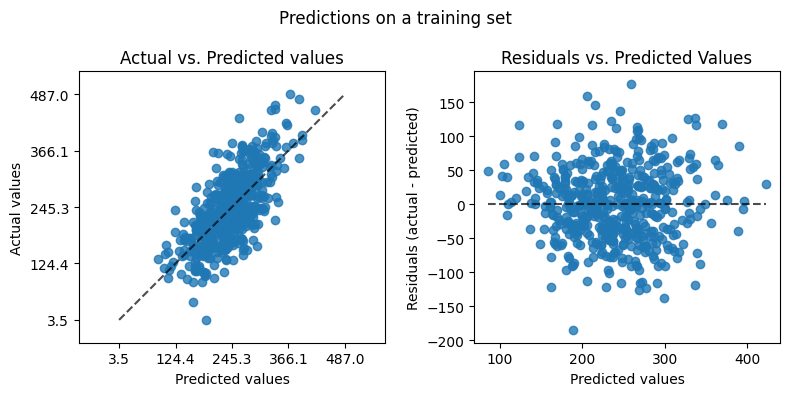

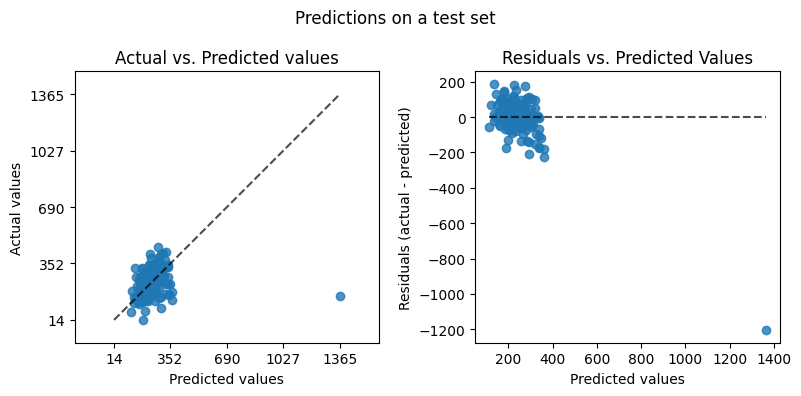

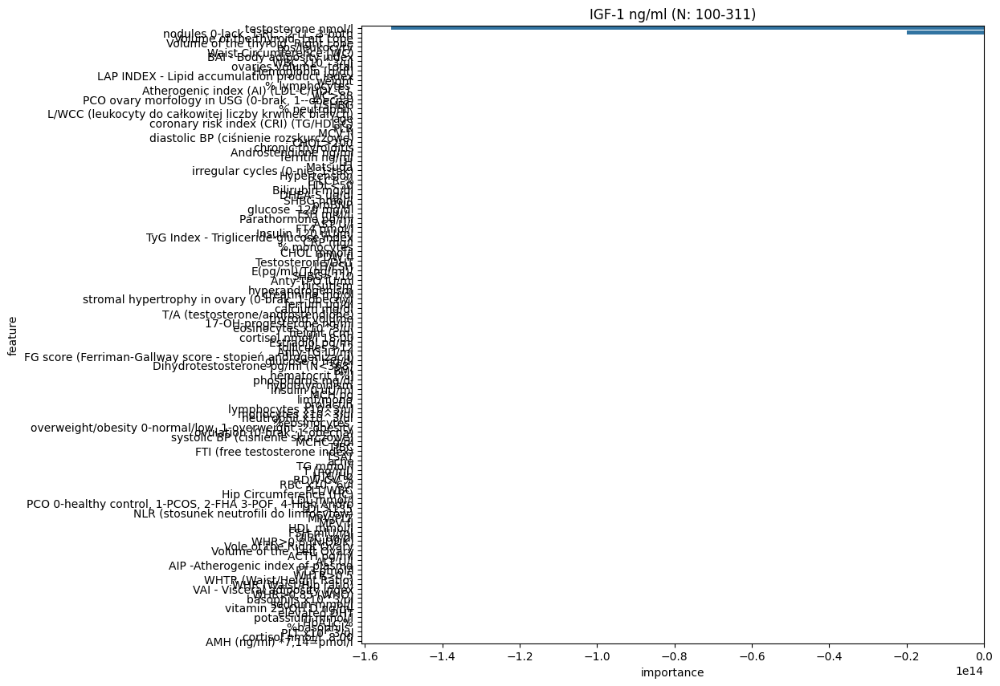

                model  data_set        mse     mae     rmse     r2
0  LinearRegression()  training   2922.200  43.276   54.057  0.506
1  LinearRegression()      test  18587.693  75.183  136.337 -1.746

Model: Lasso


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


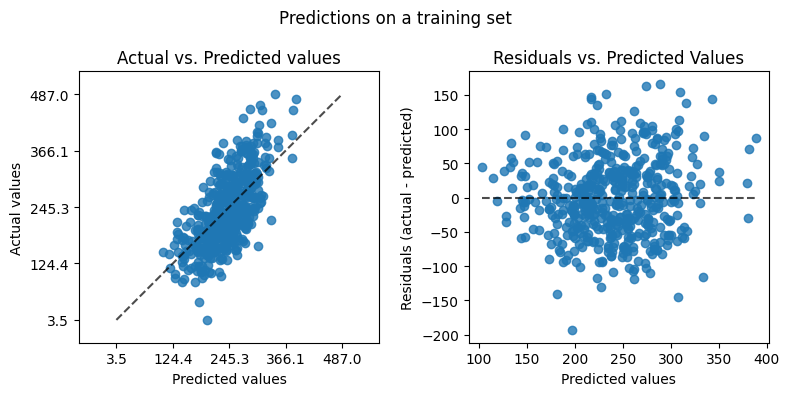

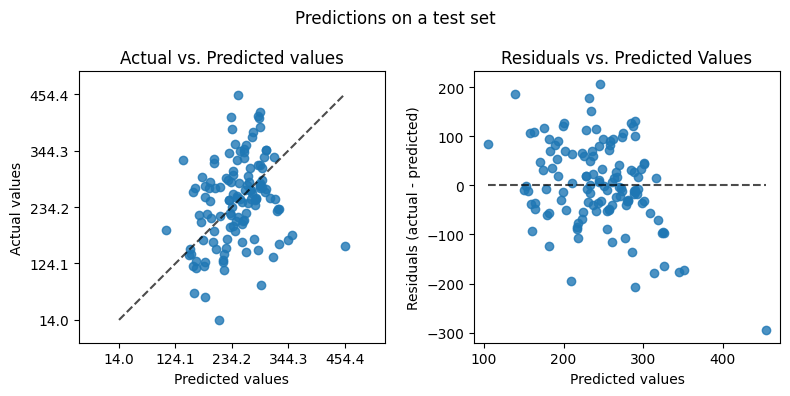

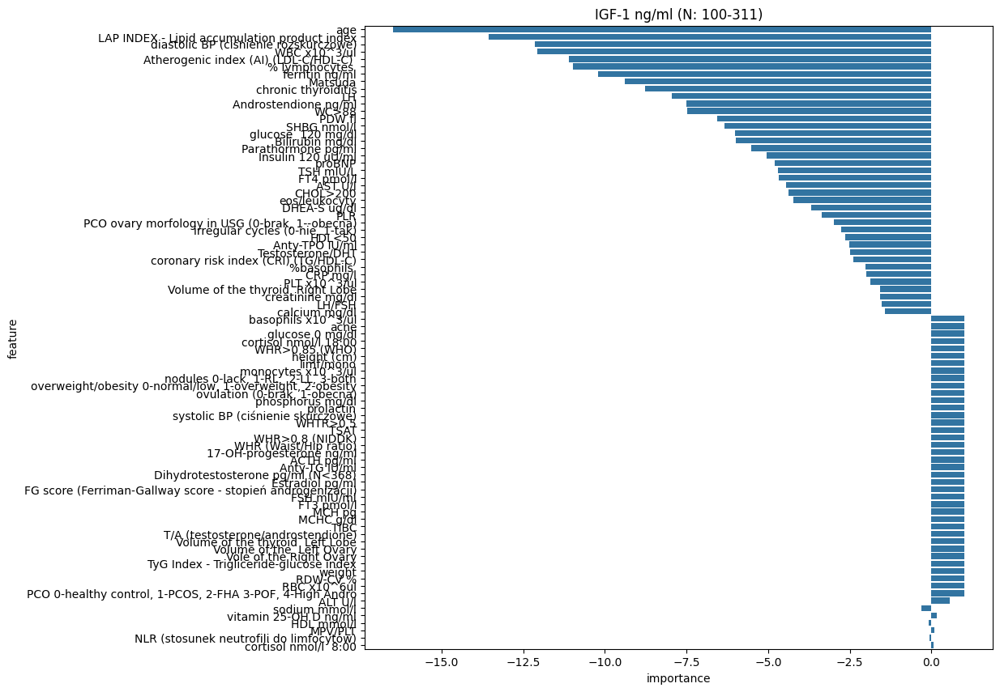

              model  data_set       mse     mae    rmse     r2
0  Lasso(alpha=0.5)  training  3215.102  45.585  56.702  0.457
1  Lasso(alpha=0.5)      test  7241.042  65.706  85.094 -0.070

Model: Ridge


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


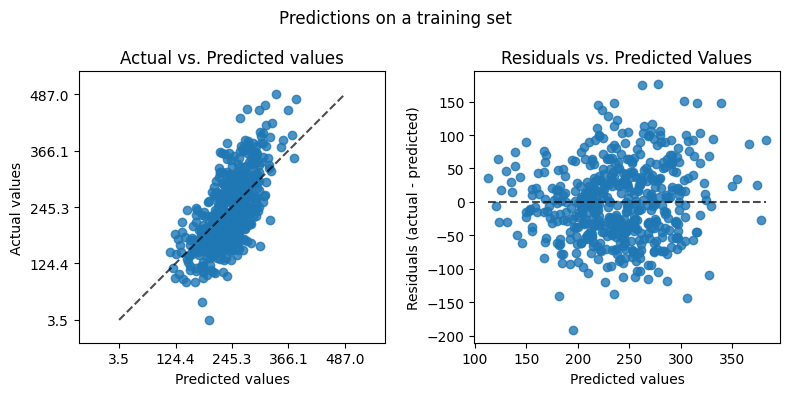

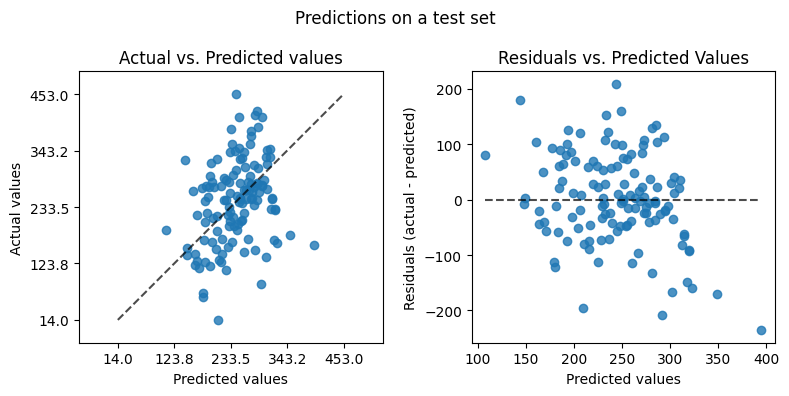

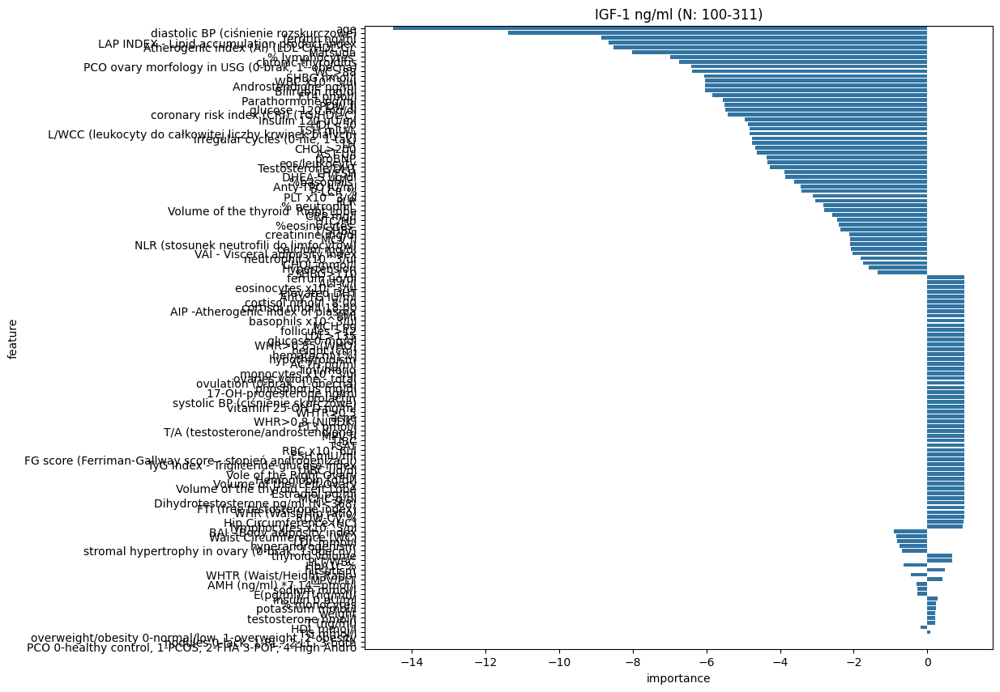

             model  data_set       mse     mae    rmse     r2
0  Ridge(alpha=50)  training  3263.471  45.971  57.127  0.449
1  Ridge(alpha=50)      test  6700.978  63.665  81.860  0.010

Model: DecisionTree


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


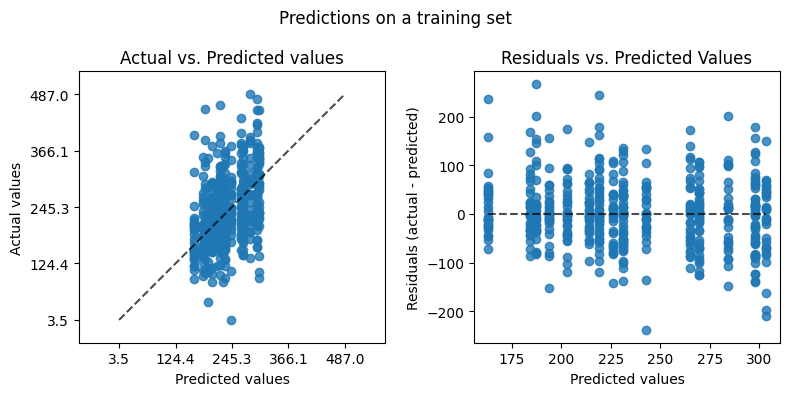

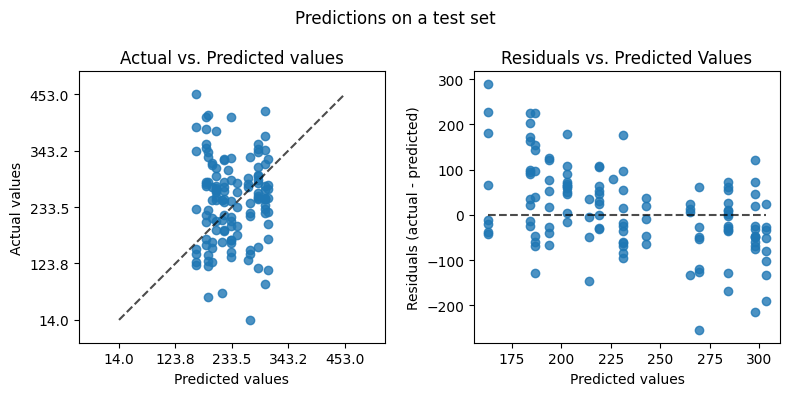

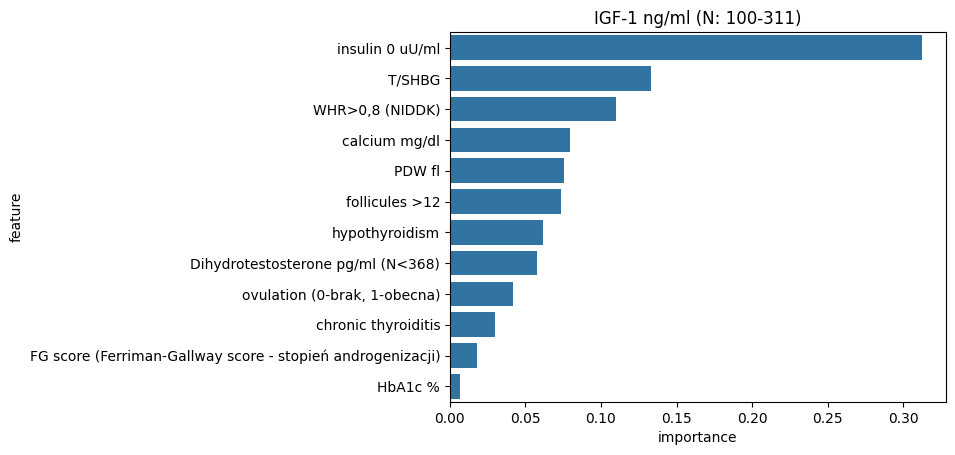

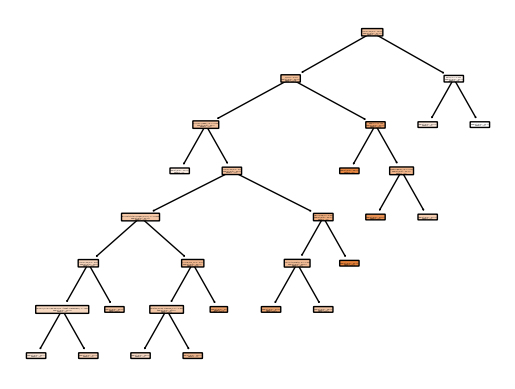

                                                                                                                                                                                         model  data_set       mse     mae    rmse     r2
0  DecisionTreeRegressor(criterion='absolute_error', max_depth=8,\n                      min_samples_leaf=27, min_samples_split=17,\n                      random_state=62, splitter='random')  training  4799.894  52.141  69.281  0.189
1  DecisionTreeRegressor(criterion='absolute_error', max_depth=8,\n                      min_samples_leaf=27, min_samples_split=17,\n                      random_state=62, splitter='random')      test  8841.964  72.698  94.032 -0.306

Model: RandomForest


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


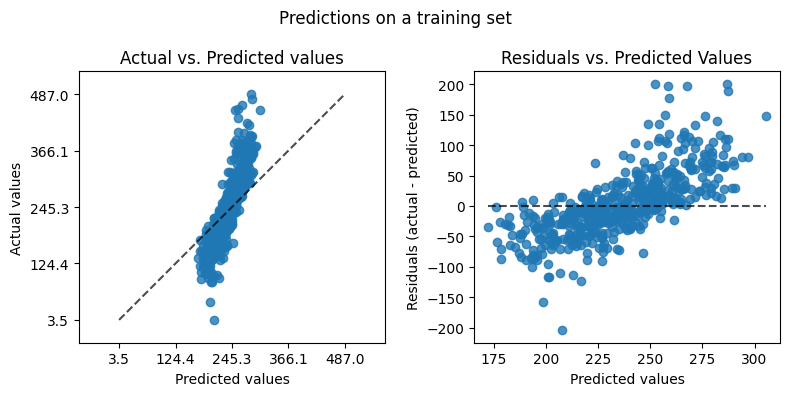

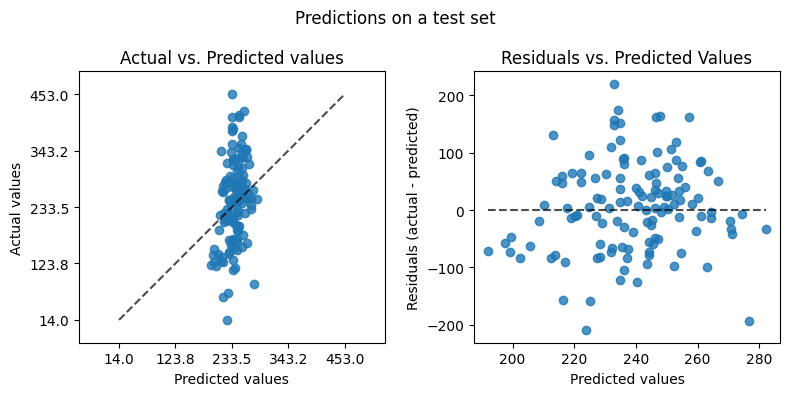

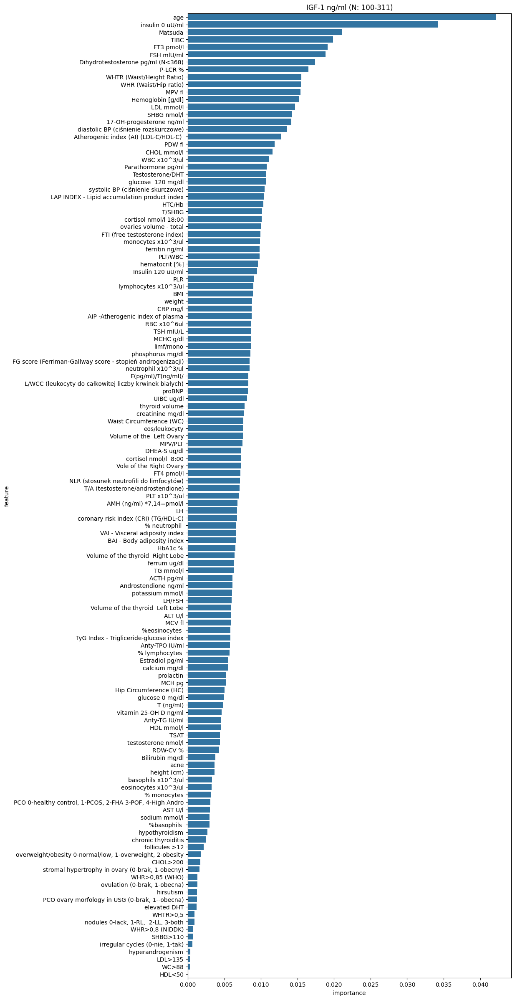

                                                                                                                                                                                               model  data_set       mse     mae    rmse     r2
0  RandomForestRegressor(criterion='absolute_error', max_features='sqrt',\n                      min_samples_leaf=7, min_samples_split=10,\n                      n_estimators=200, random_state=56)  training  3052.421  41.602  55.249  0.484
1  RandomForestRegressor(criterion='absolute_error', max_features='sqrt',\n                      min_samples_leaf=7, min_samples_split=10,\n                      n_estimators=200, random_state=56)      test  6169.841  61.786  78.548  0.088

Model: KNN


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


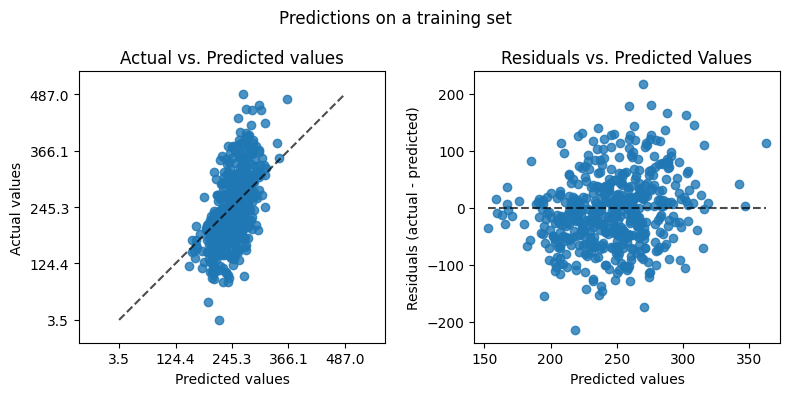

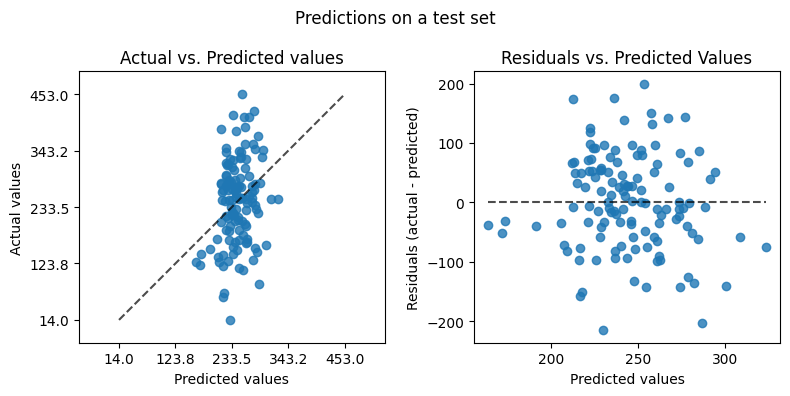

                                model  data_set       mse     mae    rmse     r2
0  KNeighborsRegressor(n_neighbors=9)  training  4082.199  50.433  63.892  0.310
1  KNeighborsRegressor(n_neighbors=9)      test  6489.591  64.798  80.558  0.041



In [13]:



models = {
    'LinearRegression': (LinearRegression(), get_feature_importance_lasso, continuous_preprocessor),
    'Lasso': (Lasso(alpha=0.5), get_feature_importance_lasso, continuous_preprocessor),
    'Ridge': (Ridge(alpha=50), get_feature_importance_lasso, continuous_preprocessor),
    'DecisionTree': (DecisionTreeRegressor(criterion="absolute_error", max_depth=8, min_samples_leaf=27, min_samples_split=17, splitter='random', random_state=62), get_feature_importance_tree, continuous_preprocessor_tree),
    'RandomForest': (RandomForestRegressor(n_estimators=200, max_depth=None, max_features='sqrt', min_samples_leaf=7, min_samples_split=10, criterion='absolute_error', random_state=56), get_feature_importance_rf, continuous_preprocessor_tree),
    'KNN': (KNeighborsRegressor(n_neighbors=9), get_feature_importance_knn, continuous_preprocessor),
    # 'SVR': (SVR(kernel='rbf', C=100, gamma=0.01, epsilon=0.01), get_feature_importance_knn, continuous_preprocessor),
}


for featureset_name, featureset in featureset_variations.items():
    print(f"Featureset: {featureset_name}")
    X_featureset = X_igf[list(featureset)]
    X_train_featureset, X_test_featureset, y_train_featureset, y_test_featureset = train_test_split(X_featureset, y_igf, test_size=0.2, random_state=42)

    for model_name, (model, feature_importance_method, cont_preprocessor) in models.items():
        print(f"Model: {model_name}")
        model_scores_df, feature_importances = train_model(model, IGF, X_train_featureset, y_train_featureset, X_test_featureset, y_test_featureset, cont_preprocessor, categorical_preprocessor, feature_importance_method)
        print(model_scores_df)
        print()


Fitting 15 folds for each of 7 candidates, totalling 105 fits
Best parameters: {'model__alpha': 2}
Best score (neg_mean_absolute_error): -56.81756598275271


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


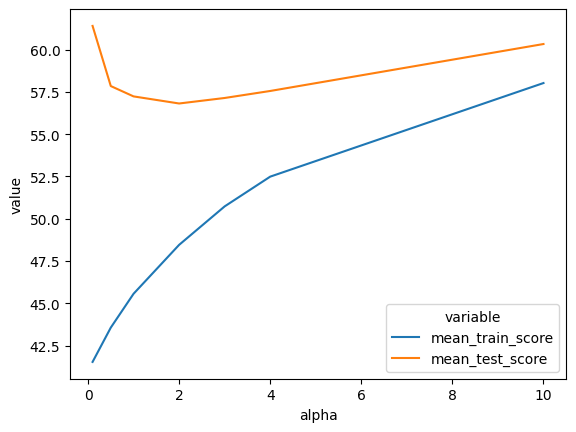

,alpha,mean_train_score,mean_test_score
0,0.1,41.532339,61.405479
1,0.5,43.562395,57.848286
2,1,45.563867,57.236932
3,2,48.456127,56.817566
4,3,50.731411,57.143535
5,4,52.490764,57.557834
6,10,58.027013,60.334798


In [ ]:
param_grid_lasso = {
    'model__alpha': [0.1, 0.5, 1, 2, 3, 4, 10],
}

lasso_model_hyperparam_tuning_df = hyperparameter_tuning_linear(X_train_igf[cropped_featureset], y_train_igf, IGF, Lasso(), continuous_preprocessor, categorical_preprocessor, param_grid_lasso, main_parameter='alpha')
lasso_model_hyperparam_tuning_df

## Feature importances

In [9]:
selected_features_map = {}

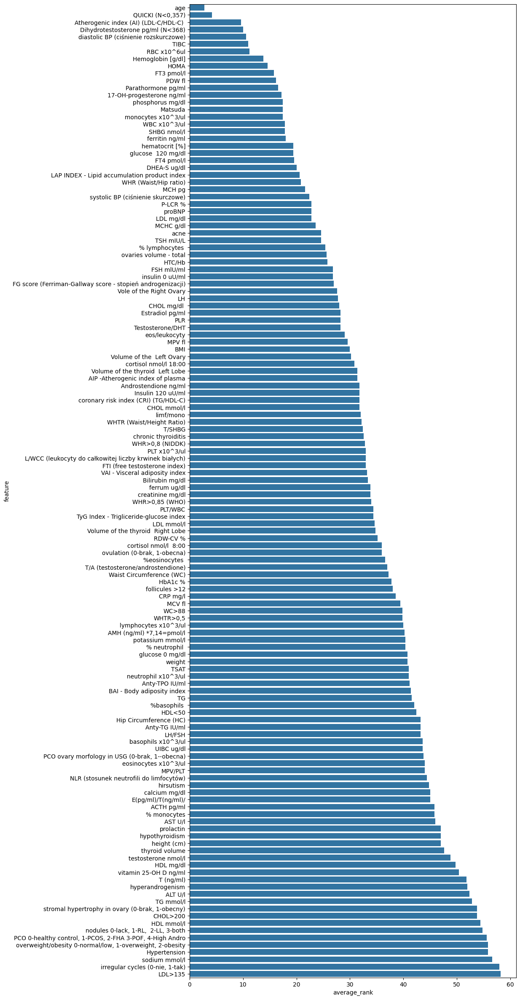

In [58]:
rename_importnace_col(feature_importnces_lr, 'linear_regression')
rename_importnace_col(feature_importnces_lasso, 'lasso')
rename_importnace_col(feature_importnces_ridge, 'ridge')
rename_importnace_col(feature_importnces_tree, 'tree')
rename_importnace_col(feature_importnces_rf, 'rf')

feature_importance_df = merge_feature_importances([feature_importnces_lr, feature_importnces_lasso, feature_importnces_ridge, feature_importnces_tree, feature_importnces_rf])

ranked_df = rank_importances(feature_importance_df)
ranked_df_sorted = ranked_df.sort_values(by='average_rank')

plt.figure(figsize=(10, 30))
sns.barplot(ranked_df_sorted, x="average_rank", y="feature")
plt.show()

In [59]:
overall_rank_top_features = ranked_df_sorted[ranked_df_sorted['average_rank'] < 30] # a cut found on the plot above
overall_rank_selected_features = list(overall_rank_top_features['feature'].values)

selected_features_map['average_rank'] = overall_rank_selected_features
print(f'Top {len(overall_rank_selected_features)} features:')
overall_rank_selected_features

Top 47 features:


['age',
 'QUICKI (N<0,357)',
 'Atherogenic index (AI) (LDL-C/HDL-C) ',
 'Dihydrotestosterone pg/ml (N<368)',
 'diastolic BP (ciśnienie rozskurczowe)',
 'TIBC',
 'RBC x10^6ul',
 'Hemoglobin [g/dl]',
 'HOMA',
 'FT3 pmol/l',
 'PDW fl',
 'Parathormone pg/ml',
 '17-OH-progesterone ng/ml',
 'phosphorus mg/dl',
 'Matsuda',
 'monocytes x10^3/ul',
 'WBC x10^3/ul',
 'SHBG nmol/l',
 'ferritin ng/ml',
 'hematocrit [%]',
 'glucose  120 mg/dl',
 'FT4 pmol/l',
 'DHEA-S ug/dl',
 'LAP INDEX - Lipid accumulation product index',
 'WHR (Waist/Hip ratio)',
 'MCH pg',
 'systolic BP (ciśnienie skurczowe)',
 'P-LCR %',
 'proBNP',
 'LDL mg/dl',
 'MCHC g/dl',
 'acne',
 'TSH mIU/L',
 '% lymphocytes ',
 'ovaries volume - total',
 'HTC/Hb',
 'FSH mlU/ml',
 'insulin 0 uU/ml',
 'FG score (Ferriman-Gallway score - stopień androgenizacji)',
 'Vole of the Right Ovary',
 'LH',
 'CHOL mg/dl ',
 'Estradiol pg/ml',
 'PLR',
 'Testosterone/DHT',
 'eos/leukocyty',
 'MPV fl']

## Feature selection methods

### Mutual info

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


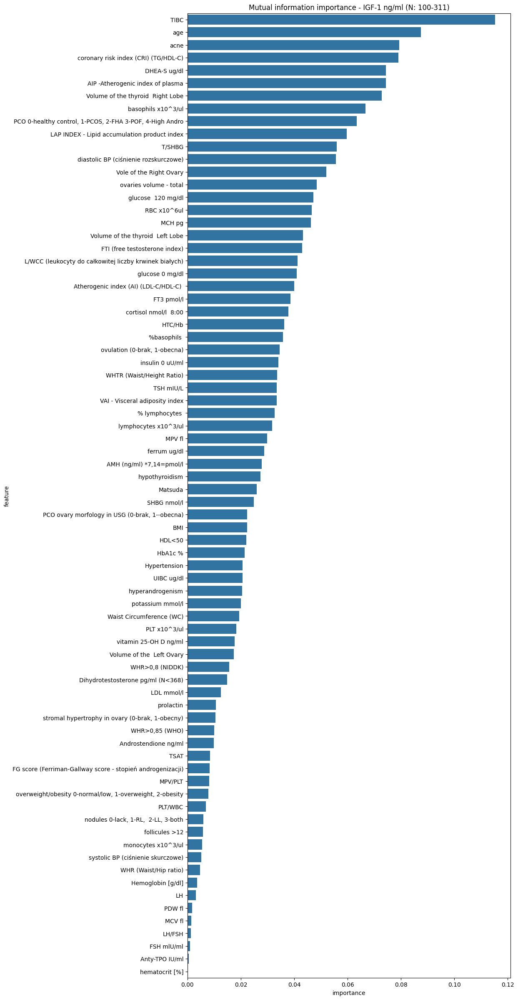

Selected 76 features


In [10]:
selected_feature_names_mutual_info = feature_selection_mutual_info_regression(X_train_igf[cropped_featureset], y_train_igf, IGF, continuous_preprocessor, categorical_preprocessor)
selected_feature_names_mutual_info = selected_feature_names_mutual_info[selected_feature_names_mutual_info['importance'] > 0]

selected_feature_names_mutual_info.reset_index(drop=True, inplace=True)
print(f'Selected {len(selected_feature_names_mutual_info)} features')
selected_features_map['mutual_info'] = list(selected_feature_names_mutual_info['feature'].values)
# selected_feature_names_mutual_info

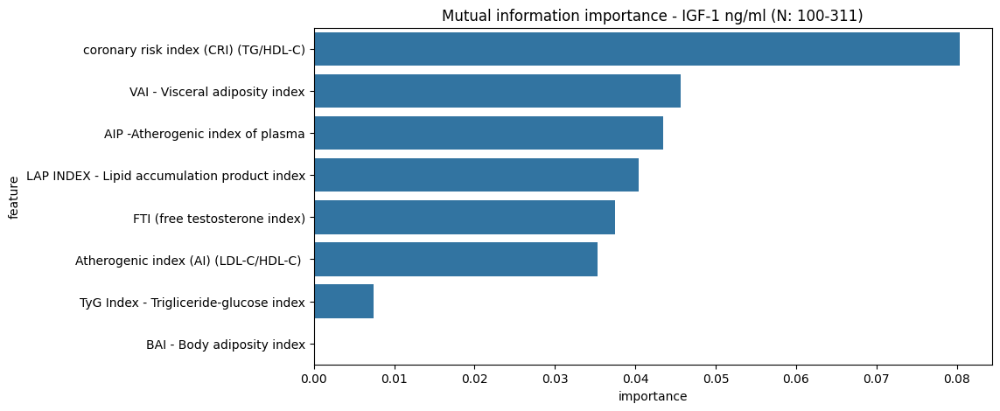

Selected 7 features


In [13]:
selected_feature_names_mutual_info = feature_selection_mutual_info_regression(X_train_igf[index_features], y_train_igf, IGF, continuous_preprocessor, categorical_preprocessor, figsize=(10, 5))
selected_feature_names_mutual_info = selected_feature_names_mutual_info[selected_feature_names_mutual_info['importance'] > 0]

selected_feature_names_mutual_info.reset_index(drop=True, inplace=True)
print(f'Selected {len(selected_feature_names_mutual_info)} features')
selected_features_map['mutual_info'] = list(selected_feature_names_mutual_info['feature'].values)
# selected_feature_names_mutual_info

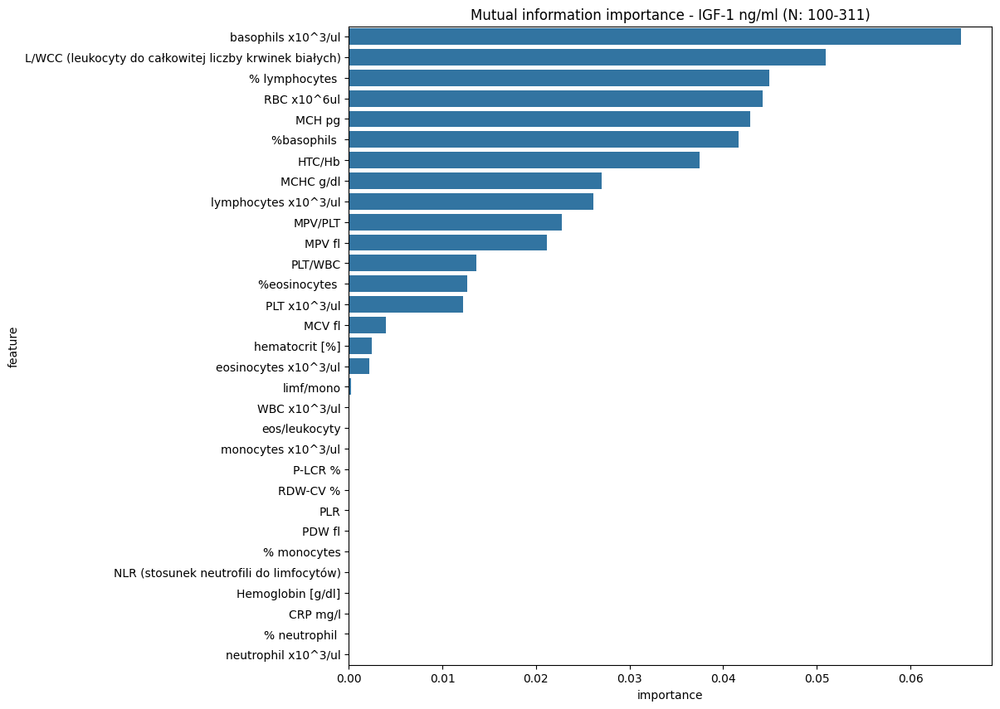

Selected 18 features


In [15]:
selected_feature_names_mutual_info = feature_selection_mutual_info_regression(X_train_igf[inflammatory_attributes], y_train_igf, IGF, continuous_preprocessor, categorical_preprocessor, figsize=(10, 10))
selected_feature_names_mutual_info = selected_feature_names_mutual_info[selected_feature_names_mutual_info['importance'] > 0]

selected_feature_names_mutual_info.reset_index(drop=True, inplace=True)
print(f'Selected {len(selected_feature_names_mutual_info)} features')
selected_features_map['mutual_info'] = list(selected_feature_names_mutual_info['feature'].values)
# selected_feature_names_mutual_info

### Recursive feature elimination

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


Optimal number of features: 23


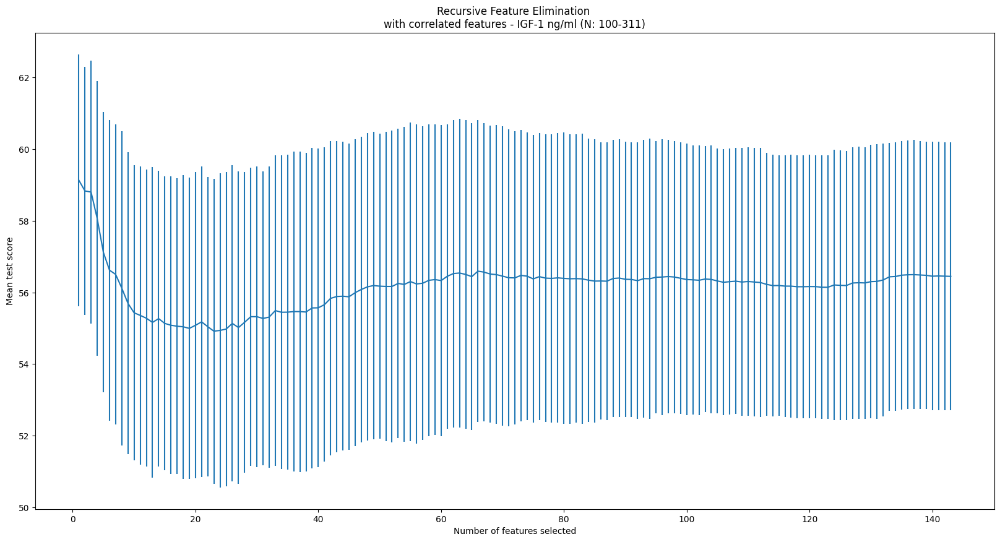

['LAP INDEX - Lipid accumulation product index',
 'QUICKI (N<0,357)',
 'Dihydrotestosterone pg/ml (N<368)',
 'RBC x10^6ul',
 'TIBC',
 'MCH pg',
 'overweight/obesity 0-normal/low, 1-overweight, 2-obesity',
 'WHR>0,8 (NIDDK)',
 'Atherogenic index (AI) (LDL-C/HDL-C) ',
 'FG score (Ferriman-Gallway score - stopień androgenizacji)',
 'glucose  120 mg/dl',
 'Androstendione ng/ml',
 'phosphorus mg/dl',
 'acne',
 'age',
 'chronic thyroiditis',
 'diastolic BP (ciśnienie rozskurczowe)',
 'ferritin ng/ml',
 'nodules 0-lack, 1-RL,  2-LL, 3-both',
 'systolic BP (ciśnienie skurczowe)',
 'Hemoglobin [g/dl]',
 'WHR>0,85 (WHO)',
 'Parathormone pg/ml']

In [73]:
# lasso_model = Lasso(alpha=1)
lasso_model = Ridge(alpha=50)

recursive_feature_elimination_ranked_features_lasso = recursive_feature_elimination(X_train_igf, y_train_igf, lasso_model, IGF, continuous_preprocessor, categorical_preprocessor)
selected_features_map['recursive_feature_elimination'] = list(recursive_feature_elimination_ranked_features_lasso[recursive_feature_elimination_ranked_features_lasso['ranking'] == 1]['feature'].values)
selected_features_map['recursive_feature_elimination']

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


Optimal number of features: 12


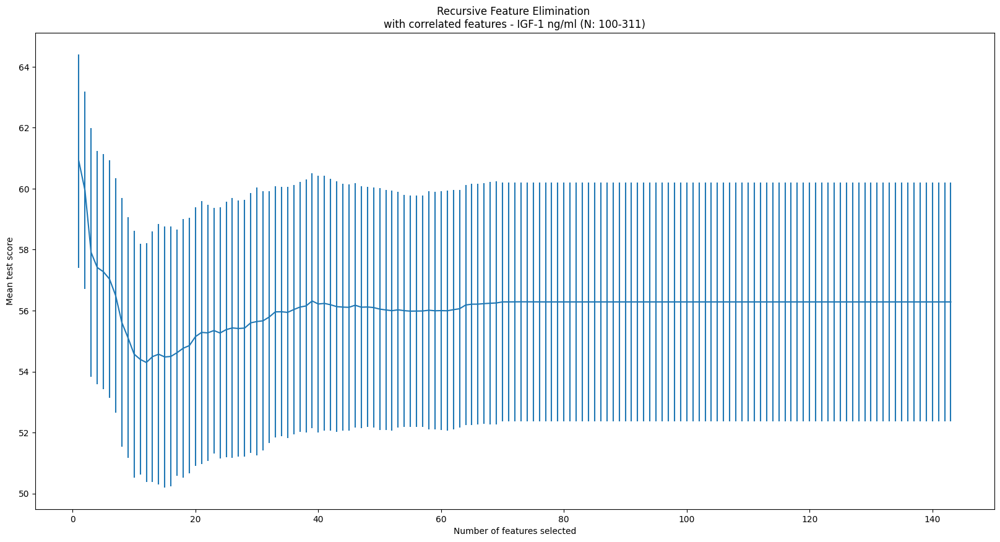

['TIBC',
 'chronic thyroiditis',
 'age',
 'acne',
 'HOMA',
 'Atherogenic index (AI) (LDL-C/HDL-C) ',
 'diastolic BP (ciśnienie rozskurczowe)',
 'phosphorus mg/dl',
 'WHR>0,85 (WHO)',
 'Hemoglobin [g/dl]',
 'systolic BP (ciśnienie skurczowe)',
 'QUICKI (N<0,357)']

In [61]:
lasso_model = Lasso(alpha=1)
# lasso_model = Ridge(alpha=50)

recursive_feature_elimination_ranked_features_lasso = recursive_feature_elimination(X_train_igf, y_train_igf, lasso_model, IGF, continuous_preprocessor, categorical_preprocessor)
selected_features_map['recursive_feature_elimination'] = list(recursive_feature_elimination_ranked_features_lasso[recursive_feature_elimination_ranked_features_lasso['ranking'] == 1]['feature'].values)
selected_features_map['recursive_feature_elimination']

### Permutation importance

selected 29 features


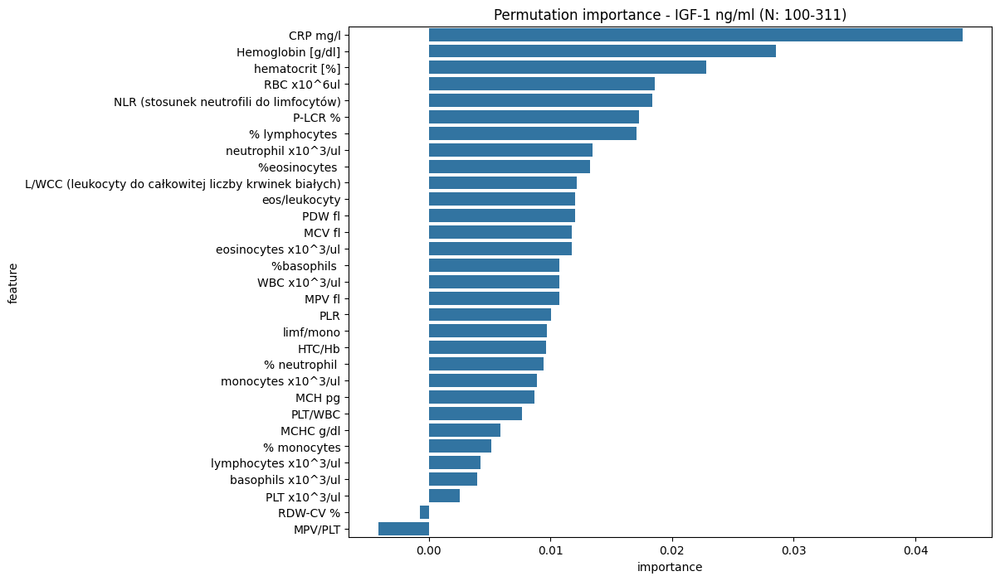

Actually selected 29 features


In [14]:
# lasso_model = Lasso(alpha=1)
knn_model = KNeighborsRegressor(n_neighbors=9)

selected_features_permutation_importance = get_permutation_importance(X_train_igf[inflammatory_attributes], y_train_igf, knn_model, continuous_preprocessor, categorical_preprocessor, IGF, figsize=(10,8))
selected_features_permutation_importance = selected_features_permutation_importance[selected_features_permutation_importance['importance'] > 0.0001]
selected_features_map['permutation_importance'] = list(selected_features_permutation_importance['feature'].values)
print(f'Actually selected {len(selected_features_map['permutation_importance'])} features')
# selected_features_permutation_importance

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


selected 88 features


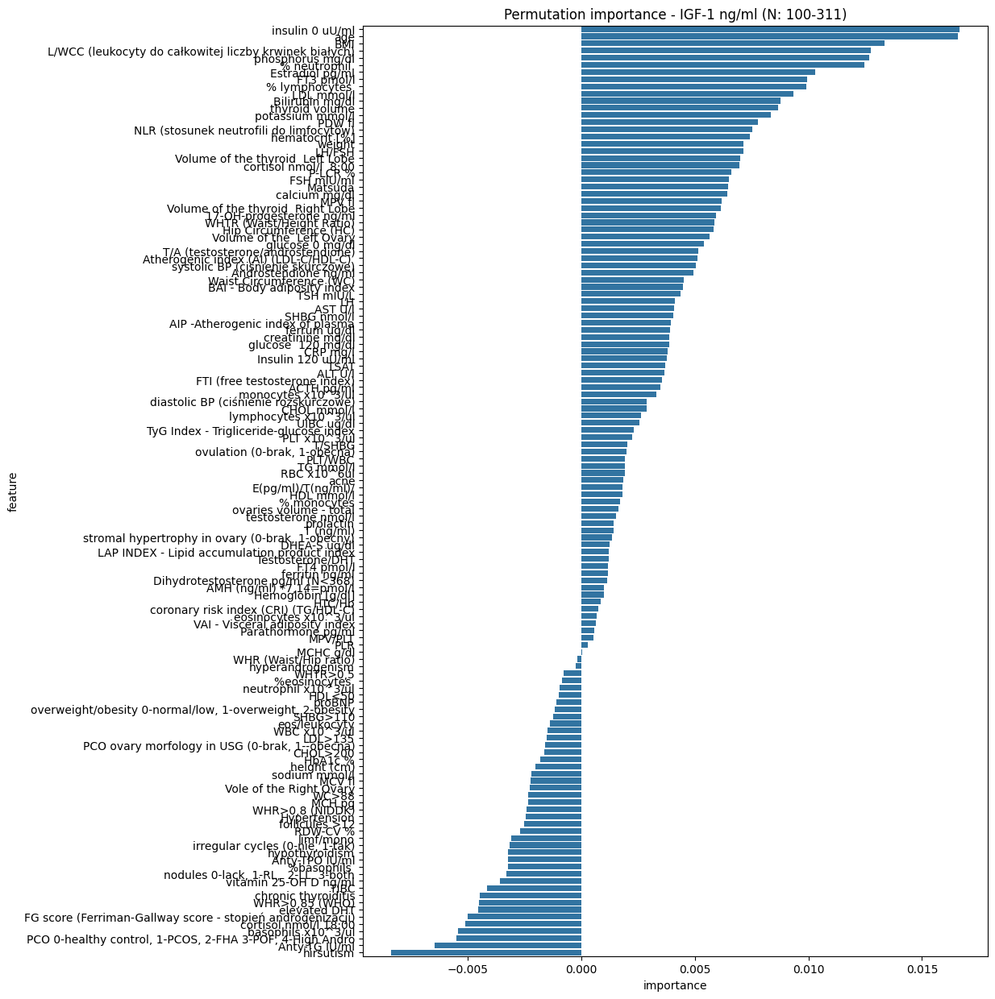

Actually selected 87 features


In [14]:
# lasso_model = Lasso(alpha=1)
knn_model = KNeighborsRegressor(n_neighbors=9)

selected_features_permutation_importance = get_permutation_importance(X_train_igf[cropped_featureset], y_train_igf, knn_model, continuous_preprocessor, categorical_preprocessor, IGF, figsize=(10,15))
selected_features_permutation_importance = selected_features_permutation_importance[selected_features_permutation_importance['importance'] > 0.0001]
selected_features_map['permutation_importance'] = list(selected_features_permutation_importance['feature'].values)
print(f'Actually selected {len(selected_features_map['permutation_importance'])} features')
# selected_features_permutation_importance

In [15]:
selected_features_permutation_importance

,feature,importance
125,insulin 0 uU/ml,0.016640
115,age,0.016567
54,BMI,0.013352
45,L/WCC (leukocyty do całkowitej liczby krwinek białych),0.012734
19,phosphorus mg/dl,0.012665
129,% neutrophil,0.012446
0,Estradiol pg/ml,0.010279
56,FT3 pmol/l,0.009951
52,% lymphocytes,0.009888
4,LDL mmol/l,0.009323


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


selected 77 features


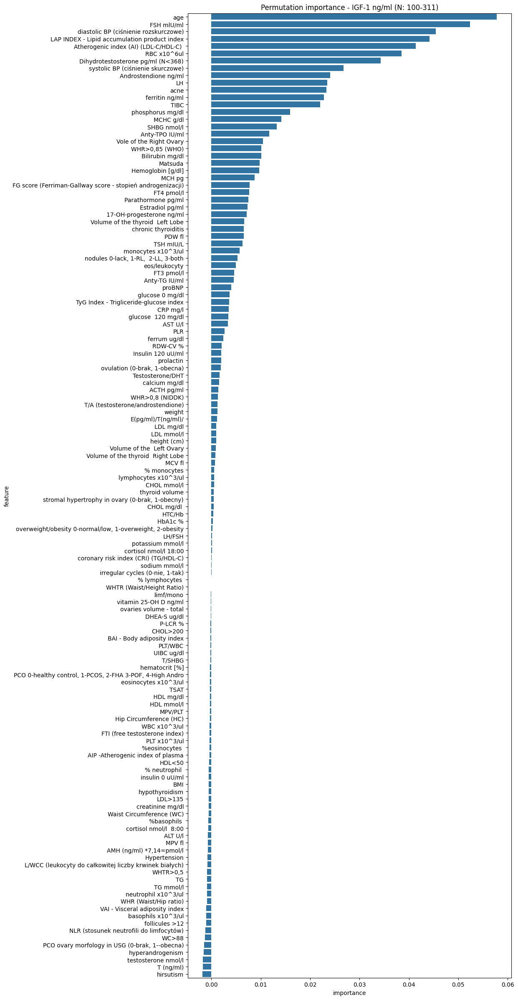

Actually selected 58 features


In [20]:
# NOTE: cropped featureset

lasso_model = Lasso(alpha=1)

selected_features_permutation_importance = get_permutation_importance(X_train_igf[cropped_featureset], y_train_igf, lasso_model, continuous_preprocessor, categorical_preprocessor, IGF)
selected_features_permutation_importance = selected_features_permutation_importance[selected_features_permutation_importance['importance'] > 0.001]
selected_features_map['permutation_importance'] = list(selected_features_permutation_importance['feature'].values)
print(f'Actually selected {len(selected_features_map['permutation_importance'])} features')
# selected_features_permutation_importance

In [17]:
# NOTE: cropped featureset,  only mutual info &  permutation importance
intersection_all_sets = set(selected_features_map[next(iter(selected_features_map))])

for key, items in selected_features_map.items():
    intersection_all_sets.intersection_update(items)


intersection_all_sets = list(intersection_all_sets)
print(len(intersection_all_sets))
print(intersection_all_sets)

pd.DataFrame(intersection_all_sets)

54
['MPV fl', 'monocytes x10^3/ul', 'FT3 pmol/l', 'FTI (free testosterone index)', 'Volume of the  Left Ovary', 'acne', 'stromal hypertrophy in ovary (0-brak, 1-obecny)', 'LDL mmol/l', 'LH/FSH', 'prolactin', 'ovaries volume - total', 'glucose  120 mg/dl', 'diastolic BP (ciśnienie rozskurczowe)', 'T/SHBG', 'Volume of the thyroid  Right Lobe', 'cortisol nmol/l  8:00', 'LH', 'WHTR (Waist/Height Ratio)', 'ovulation (0-brak, 1-obecna)', 'UIBC ug/dl', 'AMH (ng/ml) *7,14=pmol/l', 'Waist Circumference (WC)', 'ferrum ug/dl', 'FSH mlU/ml', 'SHBG nmol/l', 'potassium mmol/l', 'TSH mIU/L', 'AIP -Atherogenic index of plasma', 'Atherogenic index (AI) (LDL-C/HDL-C) ', 'lymphocytes x10^3/ul', 'Androstendione ng/ml', 'age', 'TSAT', 'VAI - Visceral adiposity index', 'PDW fl', 'PLT/WBC', 'DHEA-S ug/dl', 'L/WCC (leukocyty do całkowitej liczby krwinek białych)', 'systolic BP (ciśnienie skurczowe)', 'glucose 0 mg/dl', 'Dihydrotestosterone pg/ml (N<368)', 'insulin 0 uU/ml', 'hematocrit [%]', 'coronary risk in

,0
0,MPV fl
1,monocytes x10^3/ul
2,FT3 pmol/l
3,FTI (free testosterone index)
4,Volume of the Left Ovary
5,acne
6,"stromal hypertrophy in ovary (0-brak, 1-obecny)"
7,LDL mmol/l
8,LH/FSH
9,prolactin


In [44]:
intersection_all_sets = set(selected_features_map[next(iter(selected_features_map))])

for key, items in selected_features_map.items():
    intersection_all_sets.intersection_update(items)


intersection_all_sets = list(intersection_all_sets)
print(len(intersection_all_sets))
print(intersection_all_sets)

pd.DataFrame(intersection_all_sets)

7
['coronary risk index (CRI) (TG/HDL-C)', 'TyG Index - Trigliceride-glucose index', 'Atherogenic index (AI) (LDL-C/HDL-C) ', 'VAI - Visceral adiposity index', 'AIP -Atherogenic index of plasma', 'LAP INDEX - Lipid accumulation product index', 'FTI (free testosterone index)']


,0
0,coronary risk index (CRI) (TG/HDL-C)
1,TyG Index - Trigliceride-glucose index
2,Atherogenic index (AI) (LDL-C/HDL-C)
3,VAI - Visceral adiposity index
4,AIP -Atherogenic index of plasma
5,LAP INDEX - Lipid accumulation product index
6,FTI (free testosterone index)


In [45]:
union_all_sets = set(selected_features_map[next(iter(selected_features_map))]) 

for key, items in selected_features_map.items():
    union_all_sets.update(items)
    

union_all_sets = list(union_all_sets)
print(len(union_all_sets))
print(union_all_sets)

8
['coronary risk index (CRI) (TG/HDL-C)', 'TyG Index - Trigliceride-glucose index', 'VAI - Visceral adiposity index', 'Atherogenic index (AI) (LDL-C/HDL-C) ', 'BAI - Body adiposity index', 'AIP -Atherogenic index of plasma', 'LAP INDEX - Lipid accumulation product index', 'FTI (free testosterone index)']


## Test the narrowed down feature space

### SFS Mutual Info

In [22]:
from sklearn.feature_selection import SequentialFeatureSelector as SFS


sfs = SFS(
    estimator = RandomForestRegressor(n_estimators=100, random_state=10), 
    n_features_to_select="auto",
    tol=0.001,
    direction='backward',
    scoring='r2',
    cv=3,
    n_jobs=-1
)

sfs = sfs.fit(X_train_igf[selected_features_map['mutual_info']], y_train_igf)

In [23]:
best_features_mutual_info = sfs.get_feature_names_out()
len(best_features_mutual_info), best_features_mutual_info

(73,
 array(['TIBC', 'age', 'acne', 'coronary risk index (CRI) (TG/HDL-C)',
        'DHEA-S ug/dl', 'AIP -Atherogenic index of plasma',
        'Volume of the thyroid  Right Lobe', 'basophils x10^3/ul',
        'PCO 0-healthy control, 1-PCOS, 2-FHA 3-POF, 4-High Andro',
        'T/SHBG', 'diastolic BP (ciśnienie rozskurczowe)',
        'Vole of the Right Ovary', 'ovaries volume - total',
        'glucose  120 mg/dl', 'RBC x10^6ul', 'MCH pg',
        'Volume of the thyroid  Left Lobe',
        'FTI (free testosterone index)',
        'L/WCC (leukocyty do całkowitej liczby krwinek białych)',
        'glucose 0 mg/dl', 'Atherogenic index (AI) (LDL-C/HDL-C) ',
        'FT3 pmol/l', 'cortisol nmol/l  8:00', 'HTC/Hb', '%basophils ',
        'ovulation (0-brak, 1-obecna)', 'insulin 0 uU/ml',
        'WHTR (Waist/Height Ratio)', 'TSH mIU/L',
        'VAI - Visceral adiposity index', '% lymphocytes ',
        'lymphocytes x10^3/ul', 'MPV fl', 'ferrum ug/dl',
        'AMH (ng/ml) *7,14=pmol/l', 

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


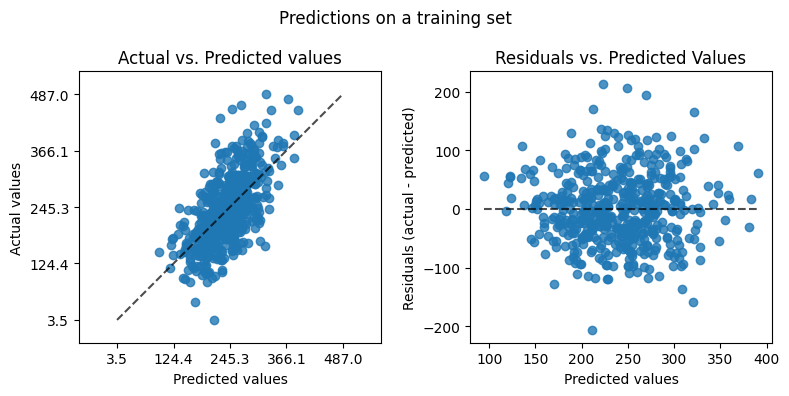

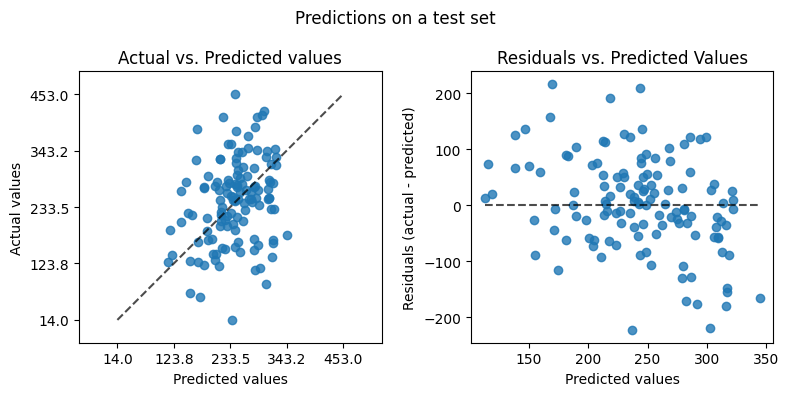

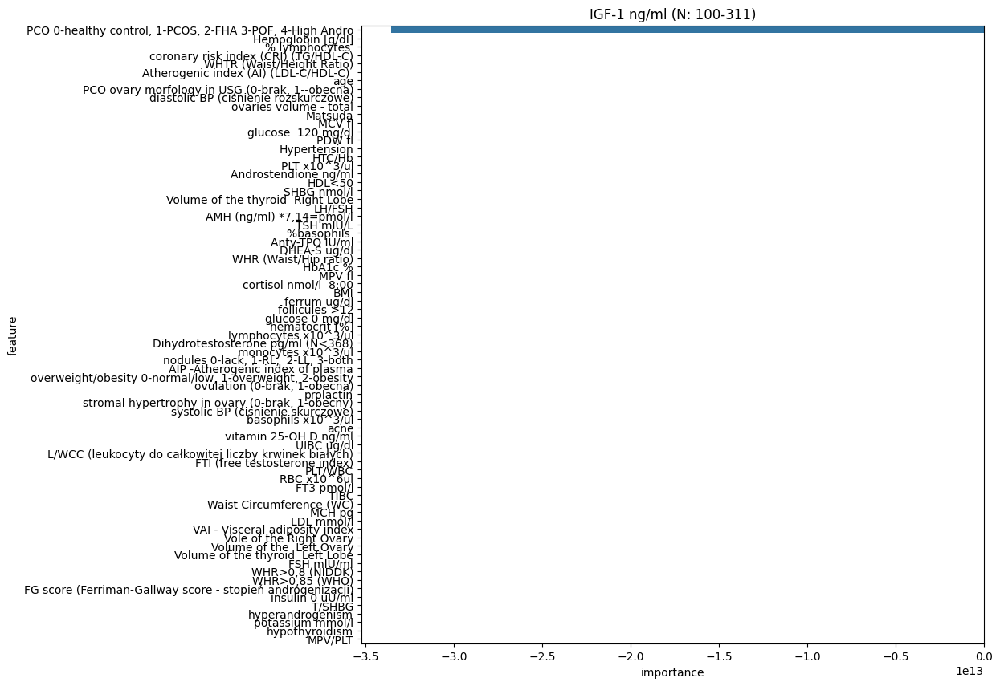

,model,data_set,mse,mae,rmse,r2
0,LinearRegression(),training,3568.465,47.287,59.737,0.397
1,LinearRegression(),test,7092.877,64.961,84.219,-0.048


In [24]:
feature_subset = best_features_mutual_info
lasso_model = LinearRegression()

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, IGF, X_train_igf[feature_subset], y_train_igf, X_test_igf[feature_subset], y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


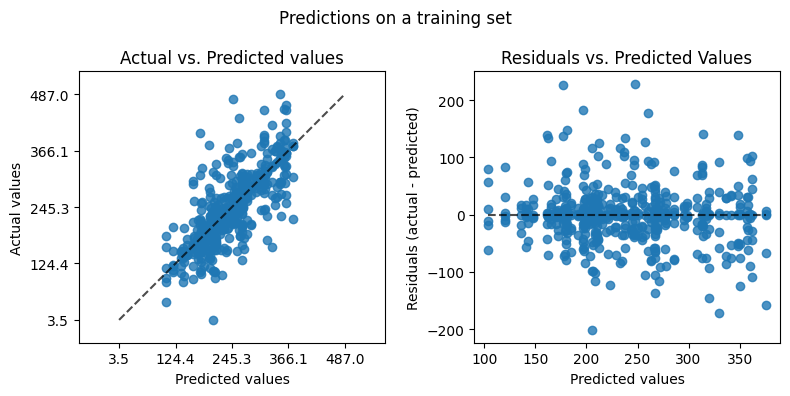

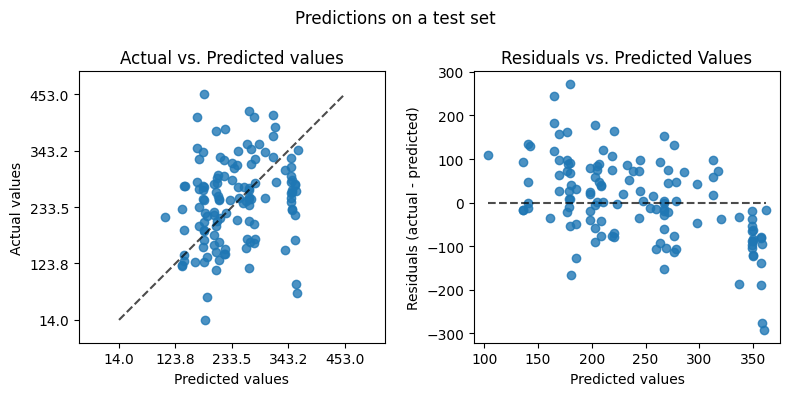

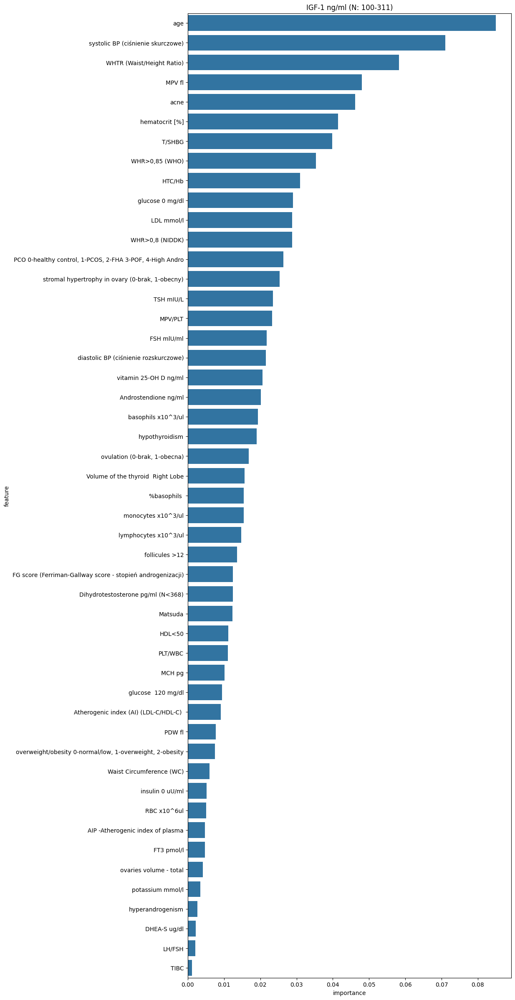

,model,data_set,mse,mae,rmse,r2
0,"DecisionTreeRegressor(criterion='absolute_error', max_depth=15,\n min_samples_leaf=5, min_samples_split=5, random_state=54,\n splitter='random')",training,2525.375,32.809,50.253,0.573
1,"DecisionTreeRegressor(criterion='absolute_error', max_depth=15,\n min_samples_leaf=5, min_samples_split=5, random_state=54,\n splitter='random')",test,8988.774,74.468,94.809,-0.328


In [25]:
feature_subset = best_features_mutual_info

lasso_model = DecisionTreeRegressor(criterion="absolute_error", max_depth=15, min_samples_leaf=5, min_samples_split=5, splitter='random', random_state=54)

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, IGF, X_train_igf[feature_subset], y_train_igf, X_test_igf[feature_subset], y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_rf)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


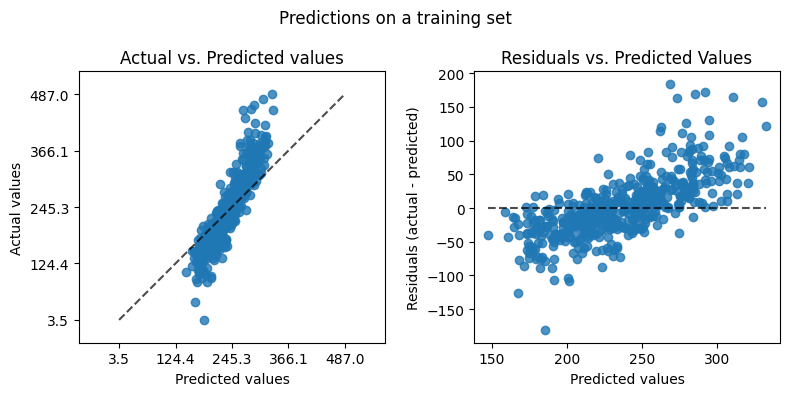

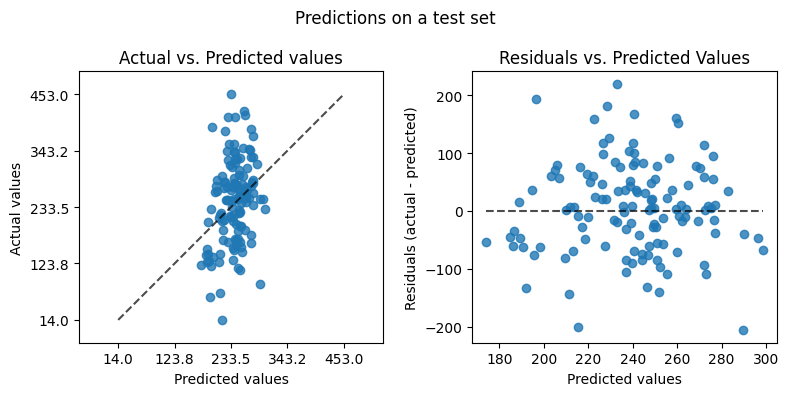

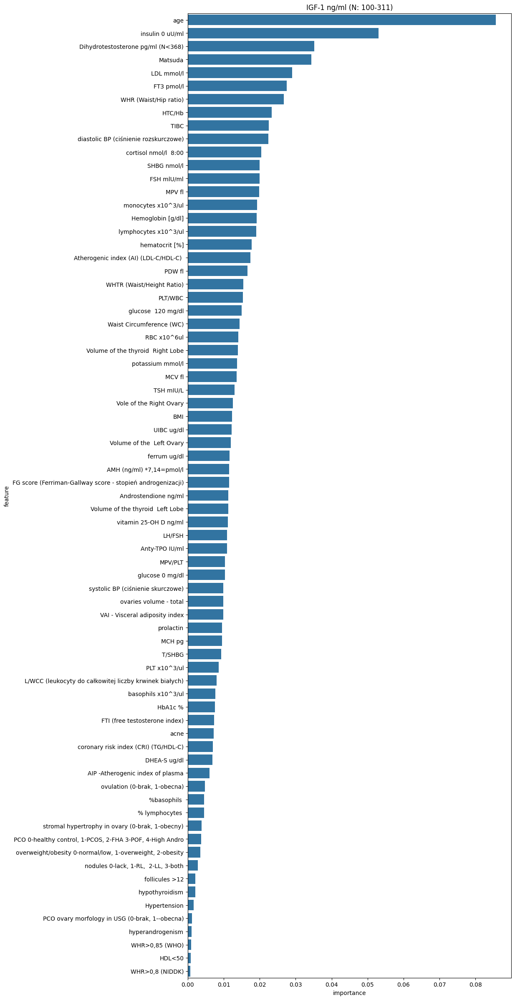

,model,data_set,mse,mae,rmse,r2
0,"RandomForestRegressor(criterion='absolute_error', min_samples_leaf=5,\n min_samples_split=5, random_state=77)",training,2084.319,33.796,45.654,0.648
1,"RandomForestRegressor(criterion='absolute_error', min_samples_leaf=5,\n min_samples_split=5, random_state=77)",test,6168.058,61.727,78.537,0.089


In [26]:
feature_subset = best_features_mutual_info

lasso_model = RandomForestRegressor(n_estimators=100, max_depth=None, min_samples_leaf=5, min_samples_split=5, criterion='absolute_error', random_state=77)

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, IGF, X_train_igf[feature_subset], y_train_igf, X_test_igf[feature_subset], y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_rf)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


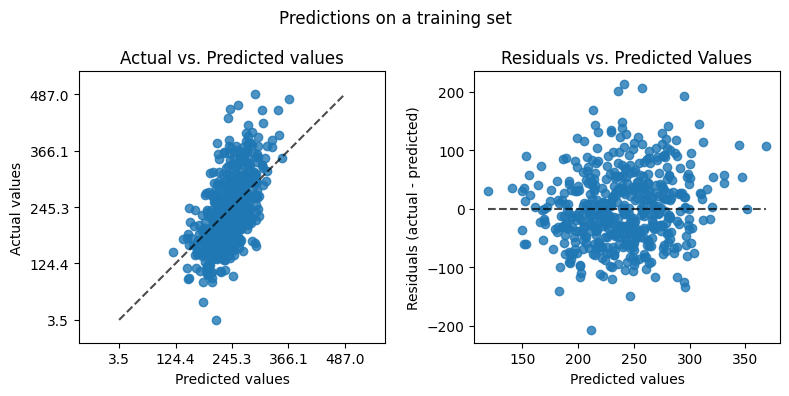

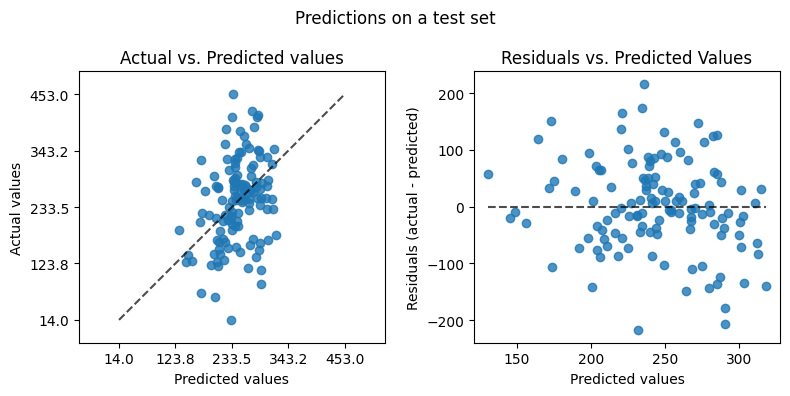

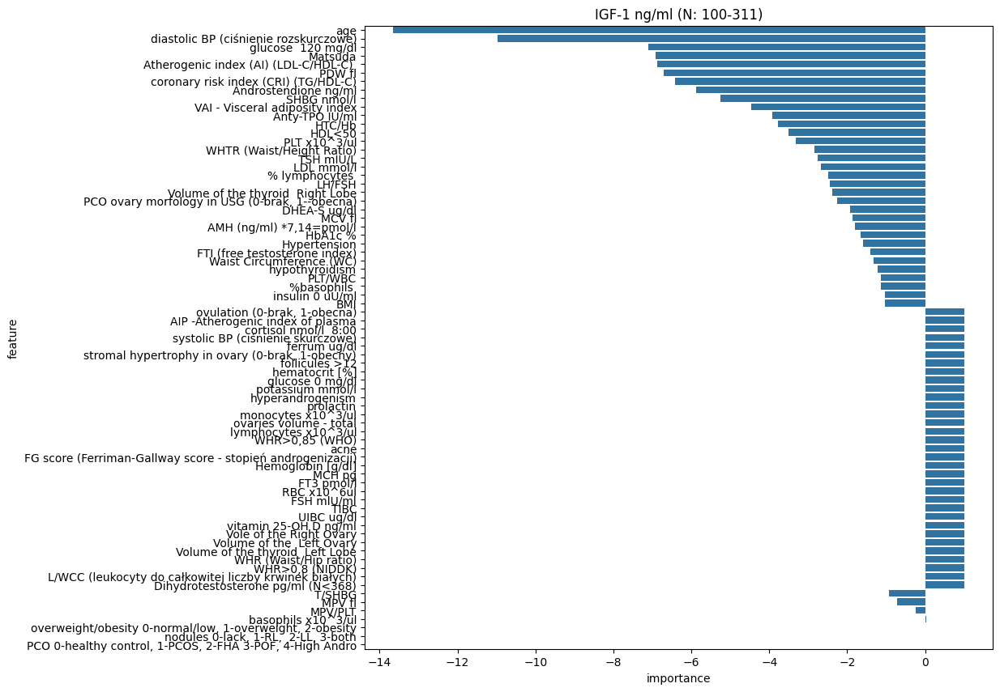

,model,data_set,mse,mae,rmse,r2
0,Ridge(alpha=100),training,3831.868,49.257,61.902,0.353
1,Ridge(alpha=100),test,6366.806,61.911,79.792,0.059


In [27]:
feature_subset = best_features_mutual_info

ridge_model = Ridge(alpha=100)

vit_d_model_scores_df, feature_importnces_ridge = train_model(ridge_model, IGF, X_train_igf[feature_subset], y_train_igf, X_test_igf[feature_subset], y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


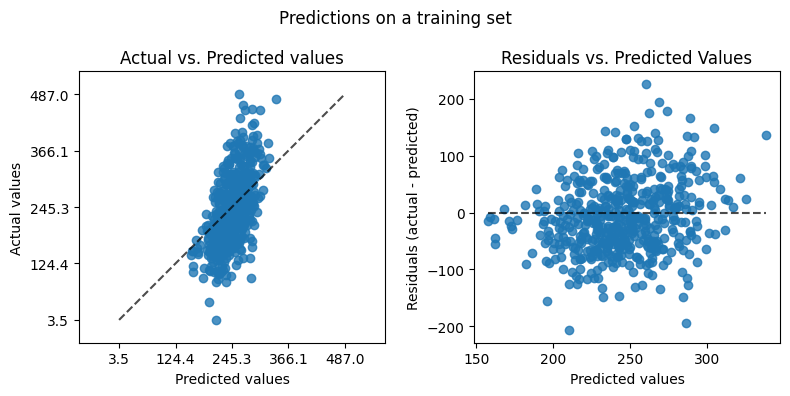

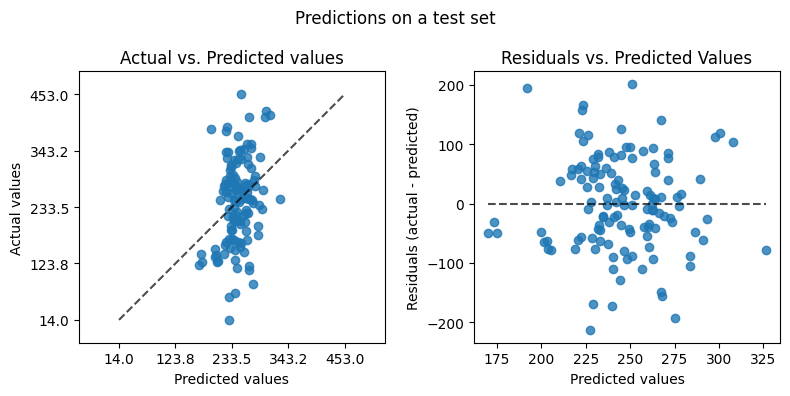

,model,data_set,mse,mae,rmse,r2
0,KNeighborsRegressor(n_neighbors=10),training,4194.289,51.751,64.763,0.291
1,KNeighborsRegressor(n_neighbors=10),test,6187.568,62.975,78.661,0.086


In [28]:
from sklearn.neighbors import KNeighborsRegressor

feature_subset = best_features_mutual_info

knn_model = KNeighborsRegressor(n_neighbors=10)

vit_d_model_scores_df, feature_importnces_knn = train_model(knn_model, IGF, X_train_igf[feature_subset], y_train_igf, X_test_igf[feature_subset], y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_knn)
vit_d_model_scores_df


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


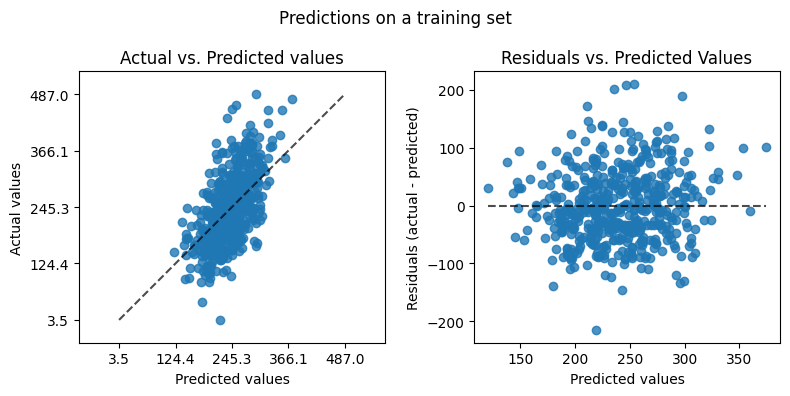

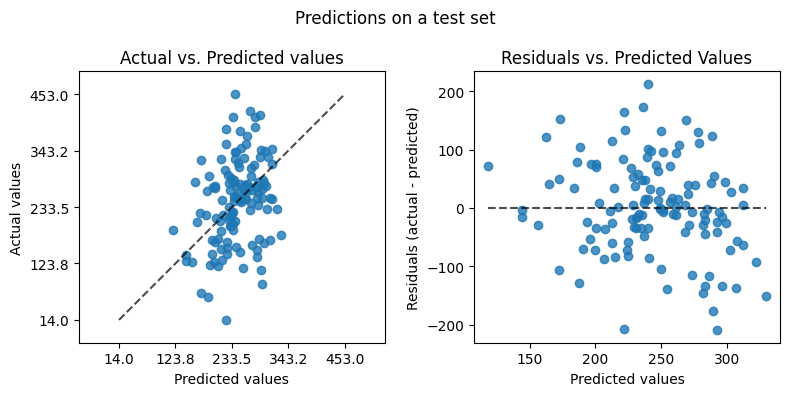

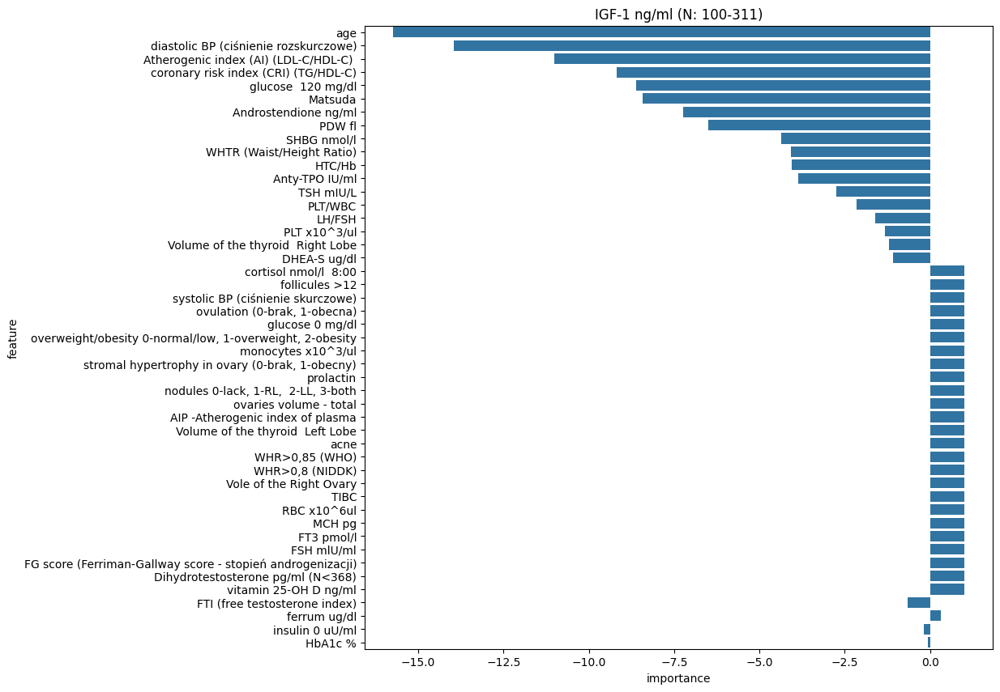

,model,data_set,mse,mae,rmse,r2
0,Lasso(alpha=1),training,3801.049,48.986,61.653,0.358
1,Lasso(alpha=1),test,6435.328,61.983,80.220,0.049


In [29]:

feature_subset = best_features_mutual_info


lasso_model = Lasso(alpha=1)

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, IGF, X_train_igf[feature_subset], y_train_igf, X_test_igf[feature_subset], y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

### SFS Permutation importance

In [30]:
from sklearn.feature_selection import SequentialFeatureSelector as SFS


sfs = SFS(
    estimator = RandomForestRegressor(n_estimators=100, random_state=10), 
    n_features_to_select="auto",
    tol=0.001,
    direction='backward',
    scoring='r2',
    cv=3,
    n_jobs=-1
)

sfs_p = sfs.fit(X_train_igf[selected_features_map['permutation_importance']], y_train_igf)

best_features_permutation = sfs_p.get_feature_names_out()
len(best_features_permutation), best_features_permutation

(85,
 array(['insulin 0 uU/ml', 'age', 'BMI',
        'L/WCC (leukocyty do całkowitej liczby krwinek białych)',
        'phosphorus mg/dl', '% neutrophil ', 'Estradiol pg/ml',
        'FT3 pmol/l', '% lymphocytes ', 'LDL mmol/l', 'Bilirubin mg/dl',
        'thyroid volume', 'potassium mmol/l', 'PDW fl',
        'NLR (stosunek neutrofili do limfocytów)', 'hematocrit [%]',
        'weight', 'LH/FSH', 'Volume of the thyroid  Left Lobe',
        'cortisol nmol/l  8:00', 'P-LCR %', 'FSH mlU/ml', 'Matsuda',
        'calcium mg/dl', 'MPV fl', 'Volume of the thyroid  Right Lobe',
        '17-OH-progesterone ng/ml', 'WHTR (Waist/Height Ratio)',
        'Hip Circumference (HC)', 'Volume of the  Left Ovary',
        'glucose 0 mg/dl', 'T/A (testosterone/androstendione)',
        'Atherogenic index (AI) (LDL-C/HDL-C) ',
        'systolic BP (ciśnienie skurczowe)', 'Androstendione ng/ml',
        'Waist Circumference (WC)', 'BAI - Body adiposity index',
        'TSH mIU/L', 'LH', 'AST U/l', 'SHBG n

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


selected 85 features


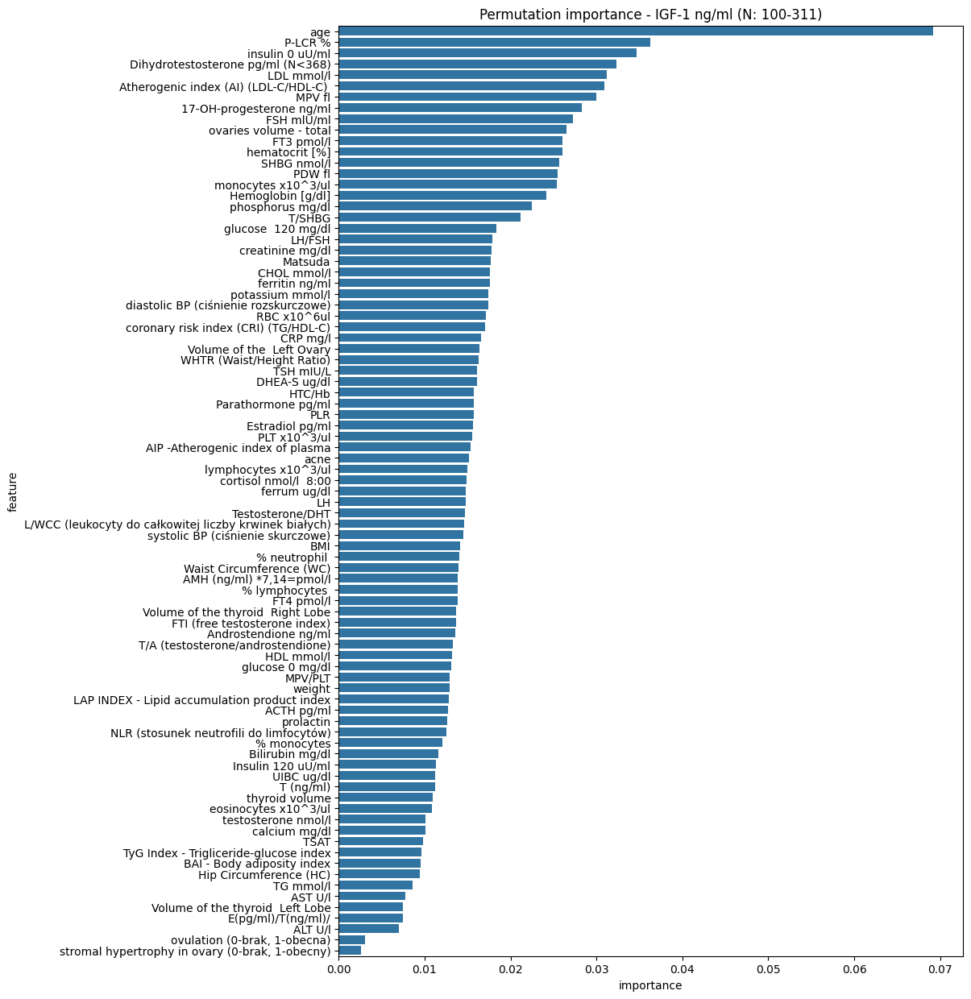

,feature,importance
1,age,0.069217
20,P-LCR %,0.036275
0,insulin 0 uU/ml,0.034694
76,Dihydrotestosterone pg/ml (N<368),0.032281
9,LDL mmol/l,0.031170
32,Atherogenic index (AI) (LDL-C/HDL-C),0.030968
24,MPV fl,0.029993
26,17-OH-progesterone ng/ml,0.028332
21,FSH mlU/ml,0.027298
66,ovaries volume - total,0.026559


In [31]:
selected_features_permutation_importance = get_permutation_importance(X_train_igf[best_features_permutation], y_train_igf, 
                                                                      RandomForestRegressor(n_estimators=100, max_depth=None, max_features='sqrt', min_samples_leaf=3, min_samples_split=3, criterion='absolute_error', random_state=56),
                                                                        continuous_preprocessor, categorical_preprocessor, IGF, figsize=(10, 15))
selected_features_permutation_importance

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


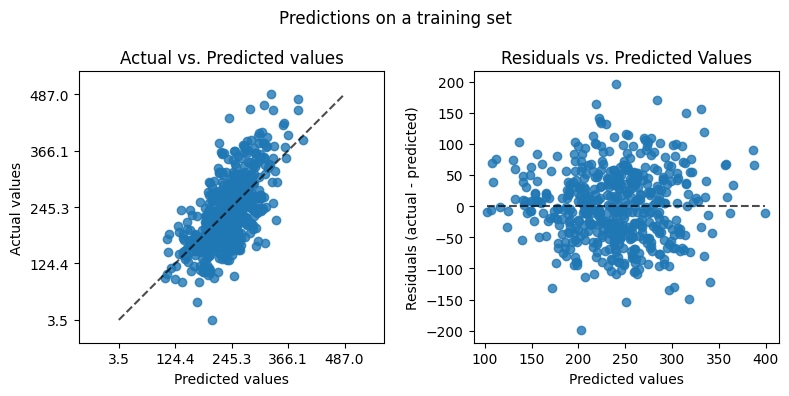

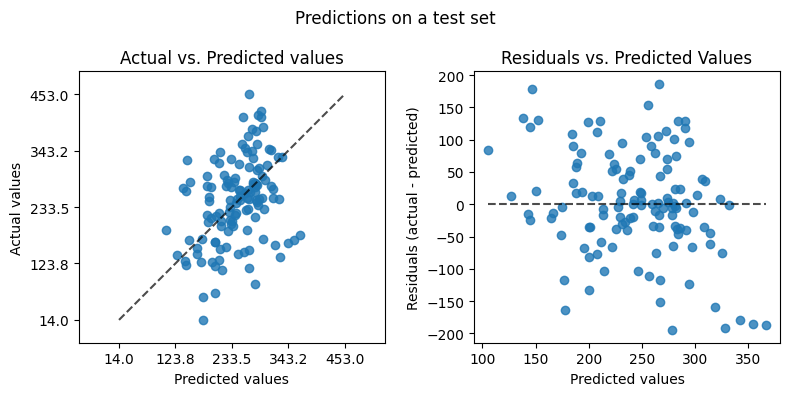

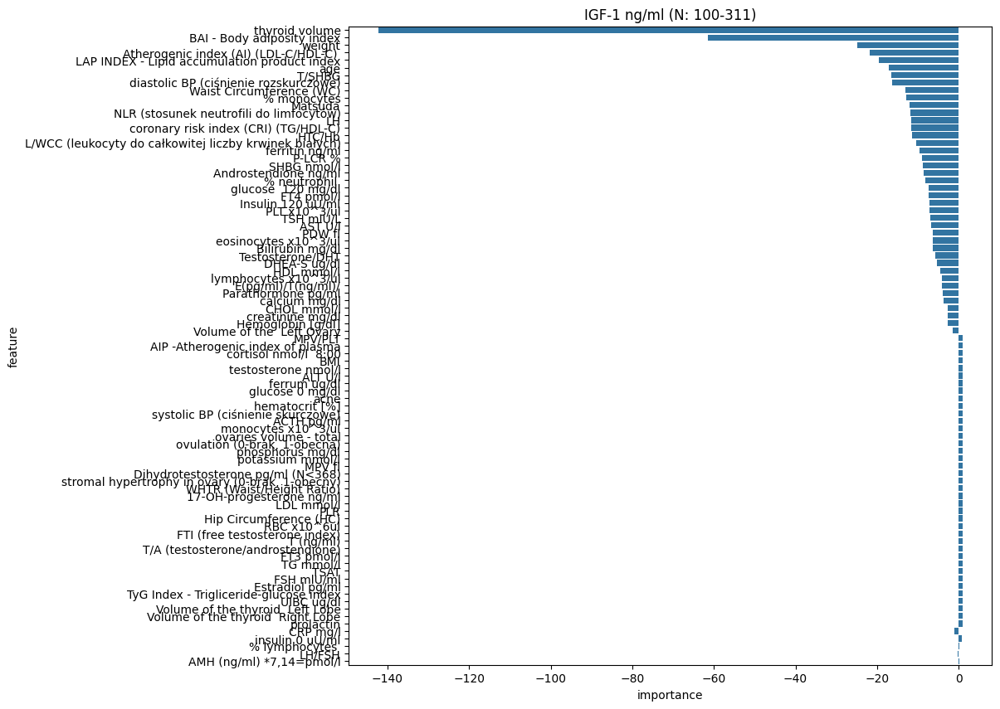

,model,data_set,mse,mae,rmse,r2
0,LinearRegression(),training,3426.369,47.036,58.535,0.421
1,LinearRegression(),test,6515.610,61.351,80.719,0.037


In [32]:
feature_subset = best_features_permutation

lr_model = LinearRegression()

vit_d_model_scores_df, feature_importnces_lr = train_model(lr_model, IGF, X_train_igf[feature_subset], y_train_igf, X_test_igf[feature_subset], y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


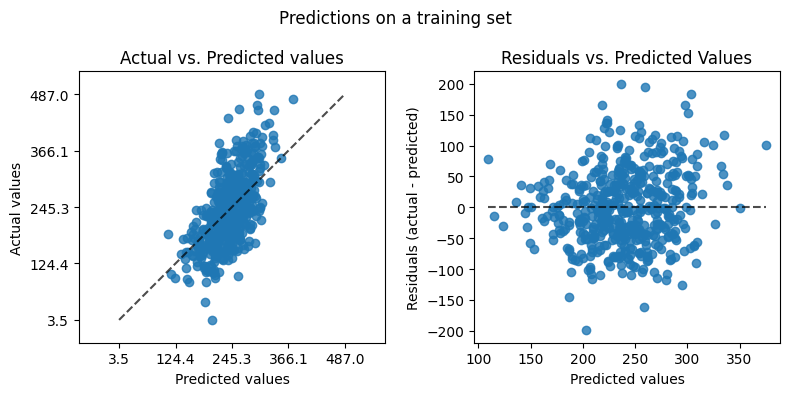

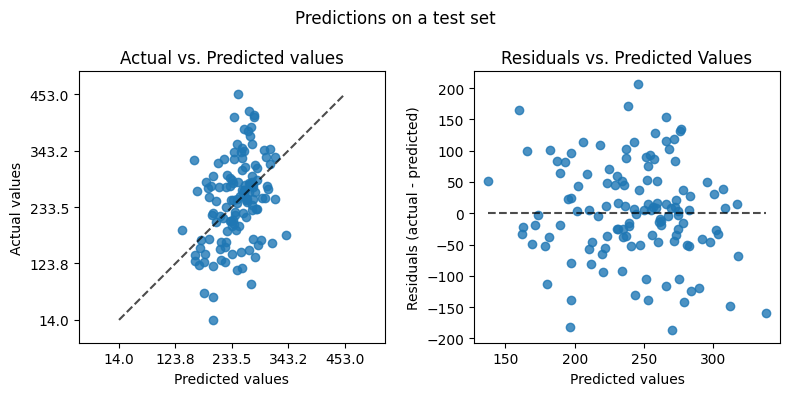

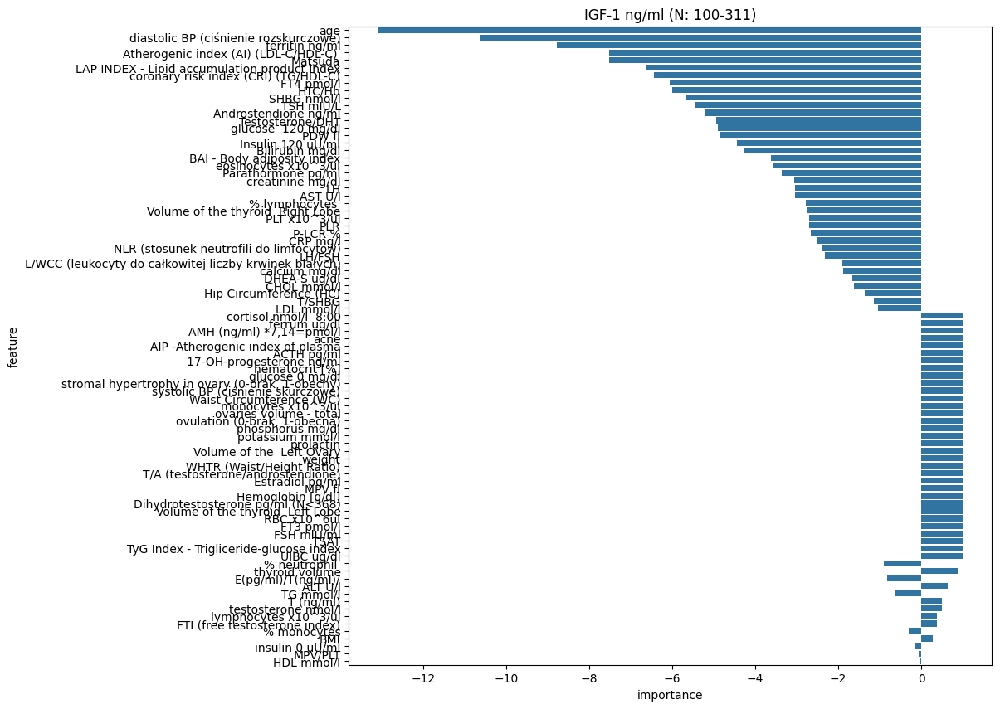

,model,data_set,mse,mae,rmse,r2
0,Ridge(alpha=100),training,3658.526,48.493,60.486,0.382
1,Ridge(alpha=100),test,5990.871,60.319,77.401,0.115


In [33]:
feature_subset = best_features_permutation


ridge_model = Ridge(alpha=100)

vit_d_model_scores_df, feature_importnces_ridge = train_model(ridge_model, IGF, X_train_igf[feature_subset], y_train_igf, X_test_igf[feature_subset], y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

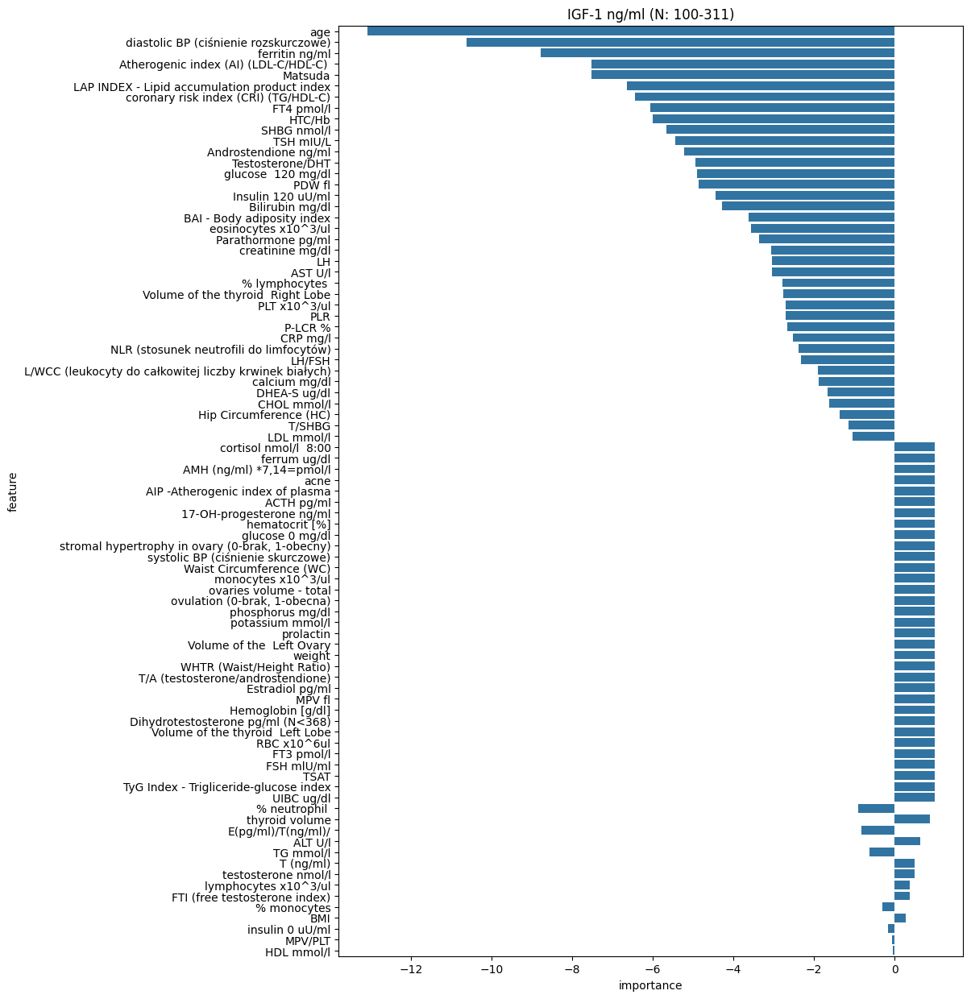

In [43]:
feature_importnces_ridge


plt.figure(figsize=(10, 15))
sns.barplot(feature_importnces_ridge, x="importance", y="feature").set(title=IGF)
plt.show()


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


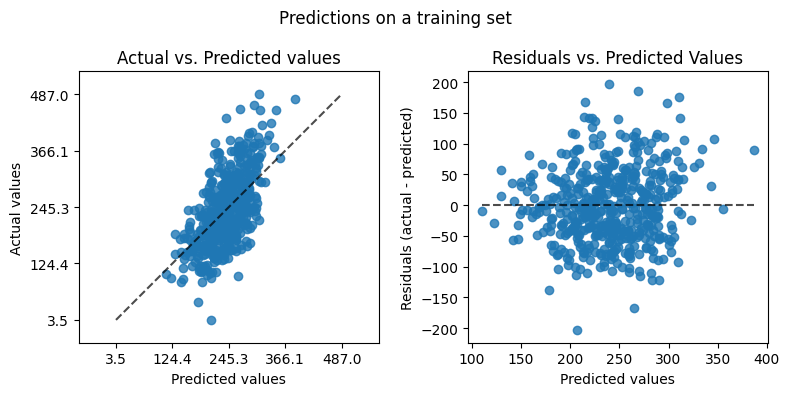

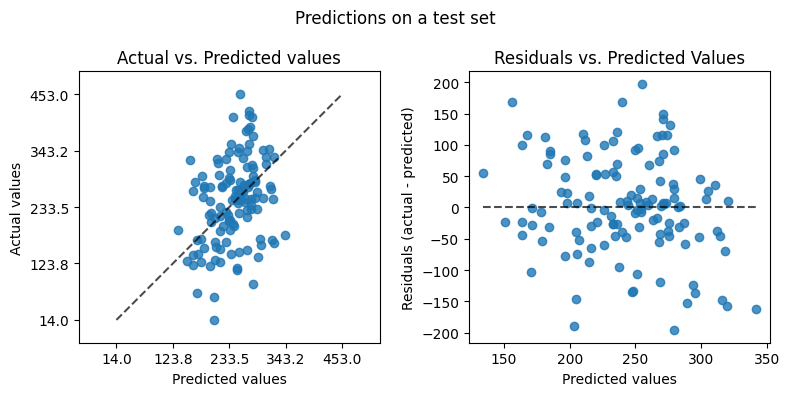

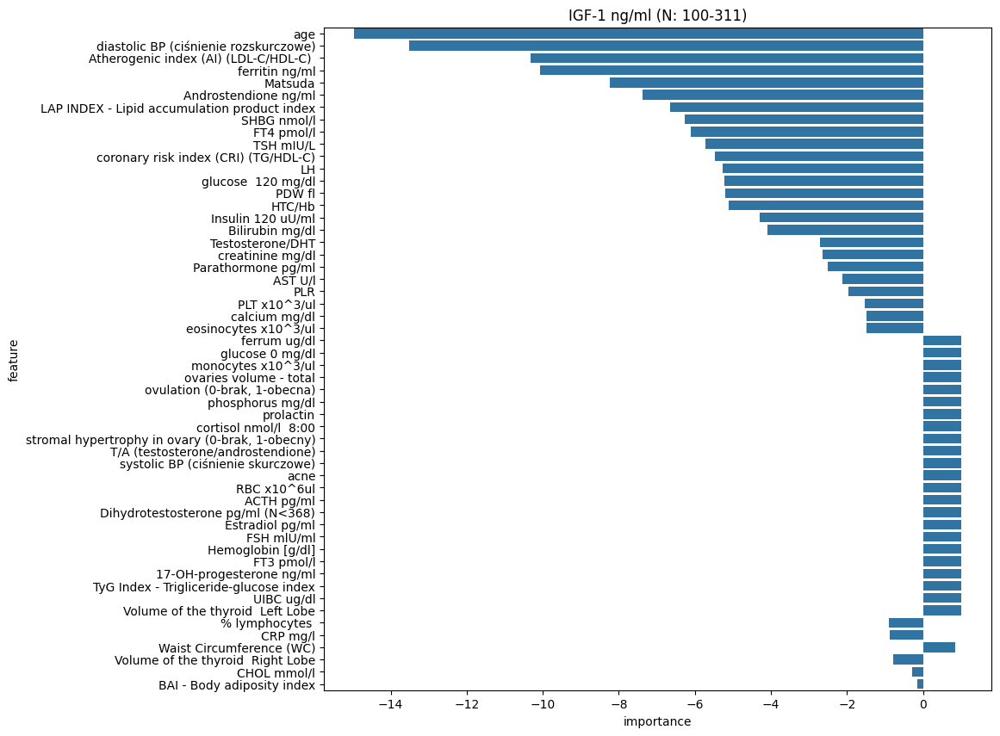

,model,data_set,mse,mae,rmse,r2
0,Lasso(alpha=1),training,3641.638,48.507,60.346,0.385
1,Lasso(alpha=1),test,6254.833,60.981,79.087,0.076


In [40]:
feature_subset = best_features_permutation


lasso_model = Lasso(alpha=1)

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, IGF, X_train_igf[feature_subset], y_train_igf, X_test_igf[feature_subset], y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


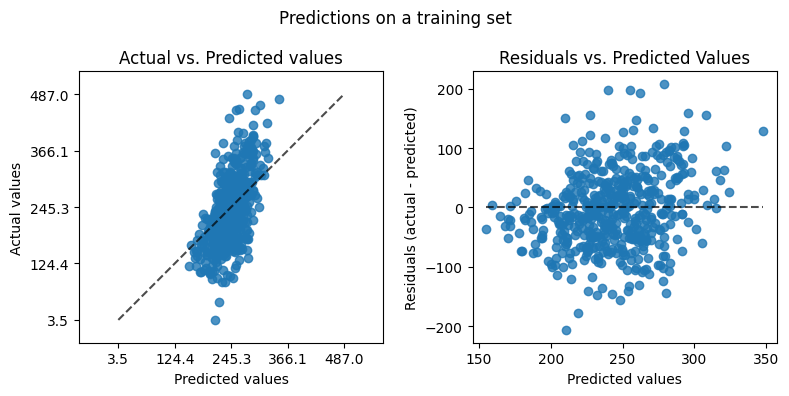

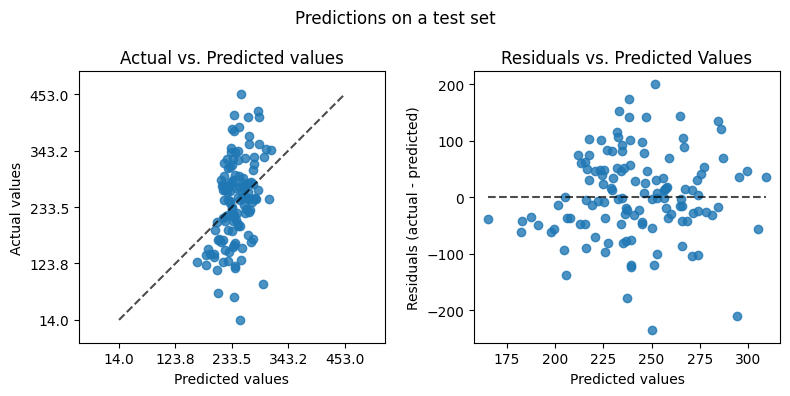

,model,data_set,mse,mae,rmse,r2
0,KNeighborsRegressor(n_neighbors=10),training,4019.581,50.185,63.400,0.321
1,KNeighborsRegressor(n_neighbors=10),test,5740.091,59.059,75.763,0.152


In [35]:
from sklearn.neighbors import KNeighborsRegressor

feature_subset = best_features_permutation

knn_model = KNeighborsRegressor(n_neighbors=10)

vit_d_model_scores_df, feature_importnces_knn = train_model(knn_model, IGF, X_train_igf[feature_subset], y_train_igf, X_test_igf[feature_subset], y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_knn)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


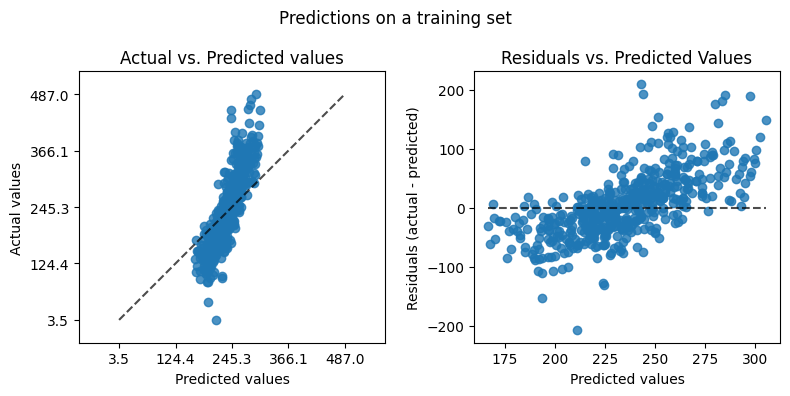

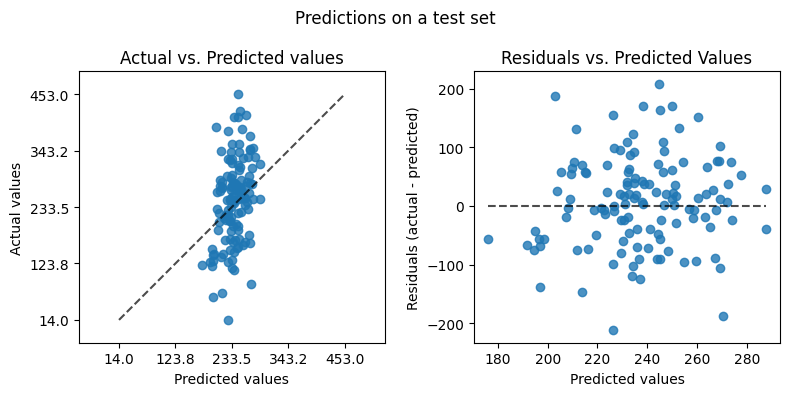

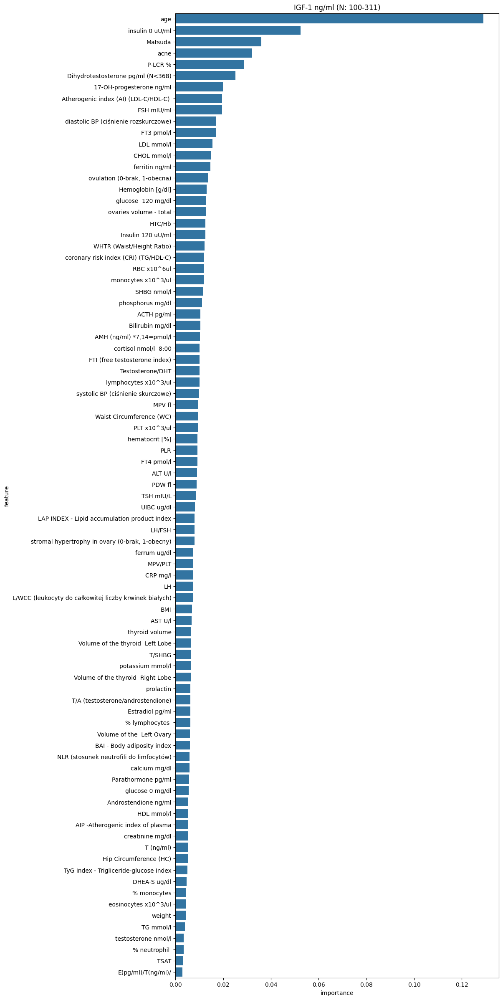

,model,data_set,mse,mae,rmse,r2
0,"RandomForestRegressor(criterion='absolute_error', min_samples_leaf=5,\n min_samples_split=5, random_state=77)",training,3062.337,42.127,55.338,0.483
1,"RandomForestRegressor(criterion='absolute_error', min_samples_leaf=5,\n min_samples_split=5, random_state=77)",test,6021.158,60.945,77.596,0.110


In [36]:
feature_subset = best_features_permutation

lasso_model = RandomForestRegressor(n_estimators=100, max_depth=None, min_samples_leaf=5, min_samples_split=5, criterion='absolute_error', random_state=77)

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, IGF, X_train_igf[feature_subset], y_train_igf, X_test_igf[feature_subset], y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_rf)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


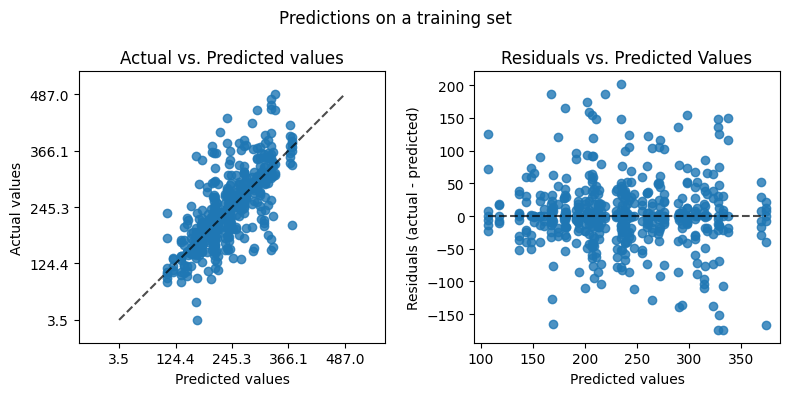

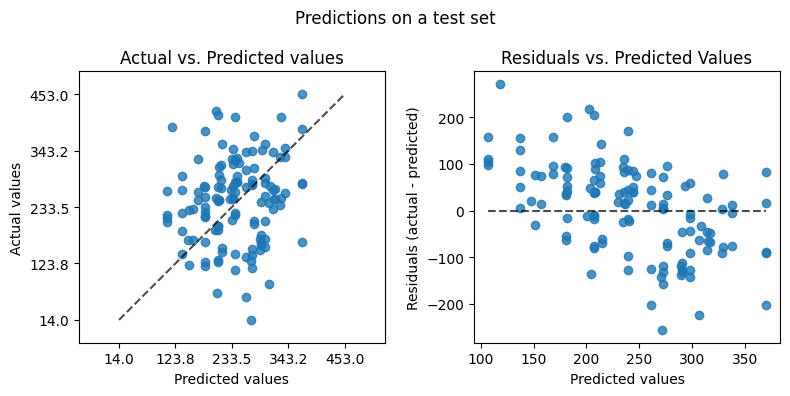

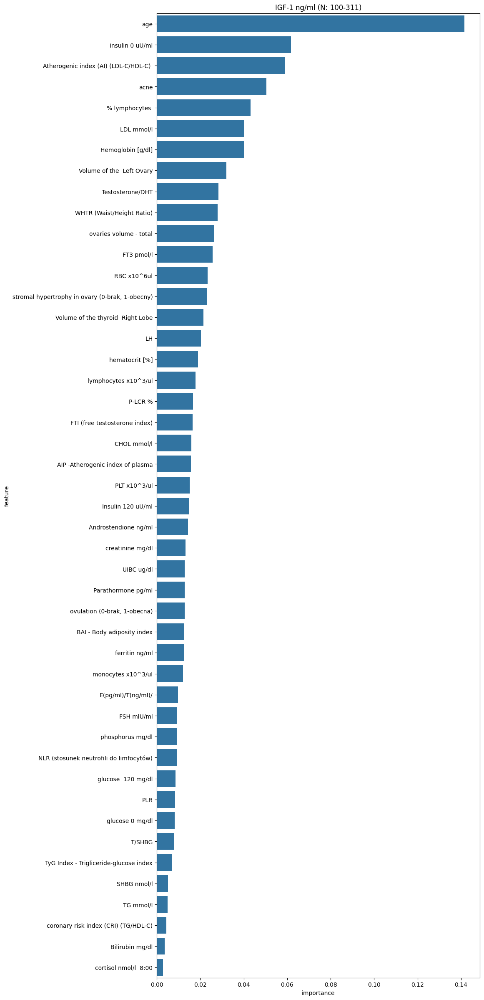

,model,data_set,mse,mae,rmse,r2
0,"DecisionTreeRegressor(criterion='absolute_error', max_depth=15,\n min_samples_leaf=5, min_samples_split=5, random_state=54,\n splitter='random')",training,2765.240,34.411,52.586,0.533
1,"DecisionTreeRegressor(criterion='absolute_error', max_depth=15,\n min_samples_leaf=5, min_samples_split=5, random_state=54,\n splitter='random')",test,9216.526,77.869,96.003,-0.362


In [37]:
feature_subset = best_features_permutation

lasso_model = DecisionTreeRegressor(criterion="absolute_error", max_depth=15, min_samples_leaf=5, min_samples_split=5, splitter='random', random_state=54)

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, IGF, X_train_igf[feature_subset], y_train_igf, X_test_igf[feature_subset], y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_rf)
vit_d_model_scores_df

## Remaining

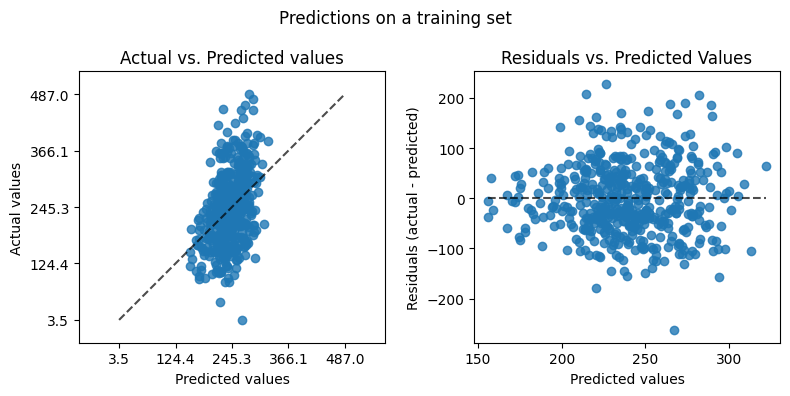

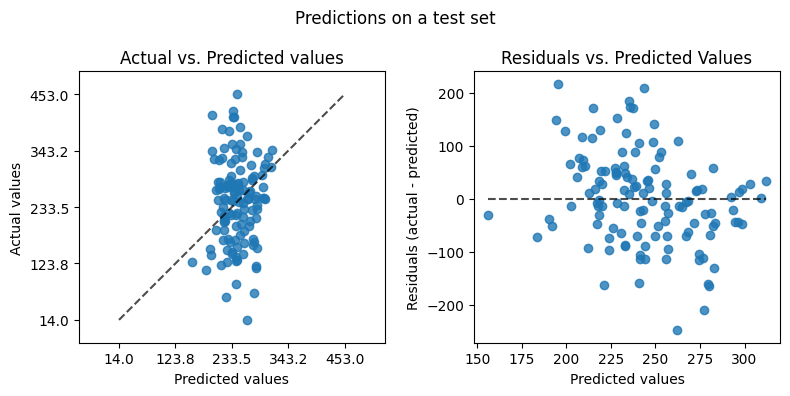

,model,data_set,mse,mae,rmse,r2
0,KNeighborsRegressor(n_neighbors=9),training,5022.035,57.034,70.866,0.152
1,KNeighborsRegressor(n_neighbors=9),test,7362.287,66.992,85.804,-0.088


In [48]:
knn_model = KNeighborsRegressor(n_neighbors=9)


vit_d_model_scores_df, feature_importnces_knn = train_model(knn_model, IGF, X_train_igf[union_all_sets], y_train_igf, X_test_igf[union_all_sets], y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_knn)
vit_d_model_scores_df

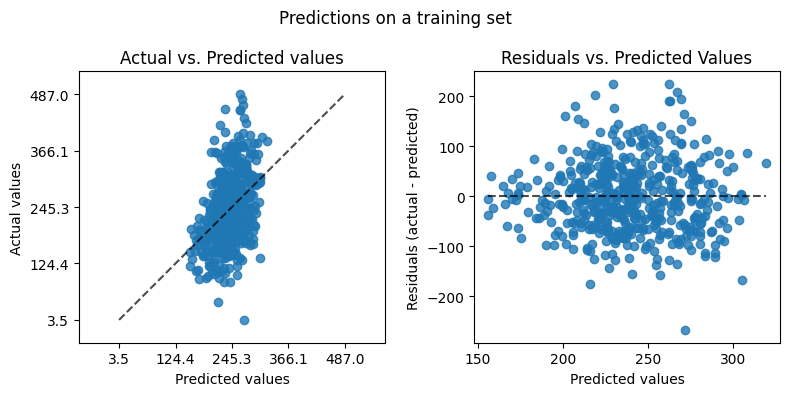

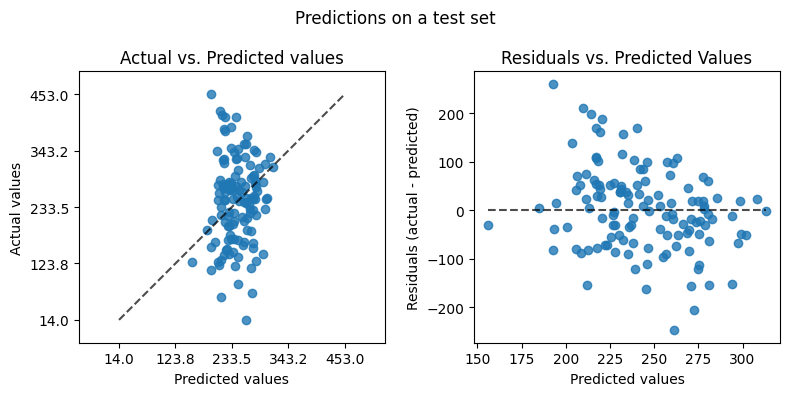

,model,data_set,mse,mae,rmse,r2
0,KNeighborsRegressor(n_neighbors=9),training,5019.116,56.246,70.846,0.152
1,KNeighborsRegressor(n_neighbors=9),test,7333.503,66.295,85.636,-0.083


In [47]:
knn_model = KNeighborsRegressor(n_neighbors=9)


vit_d_model_scores_df, feature_importnces_knn = train_model(knn_model, IGF, X_train_igf[intersection_all_sets], y_train_igf, X_test_igf[intersection_all_sets], y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_knn)
vit_d_model_scores_df

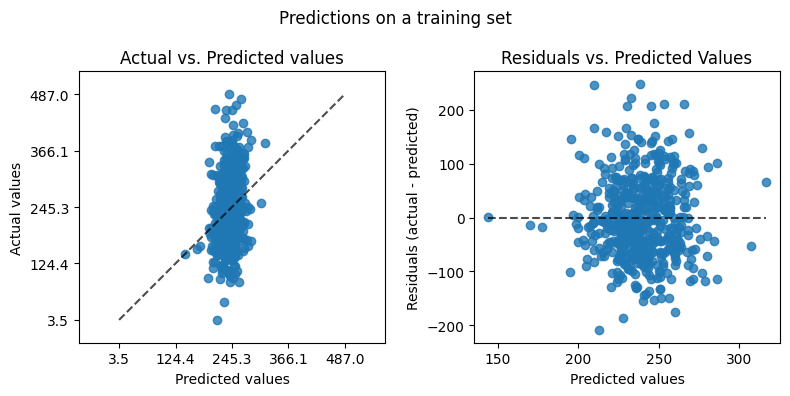

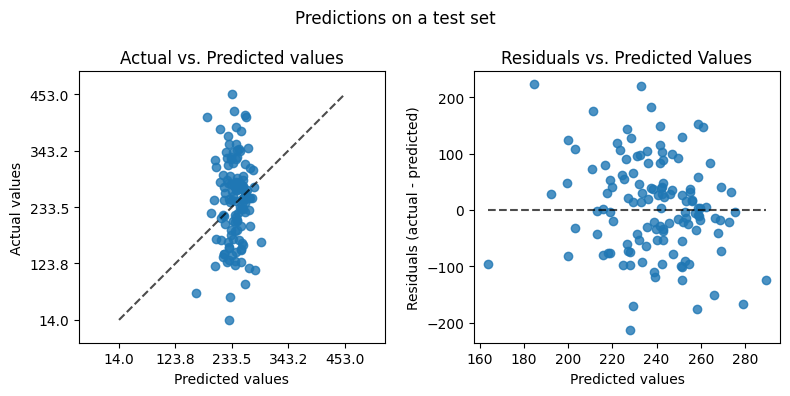

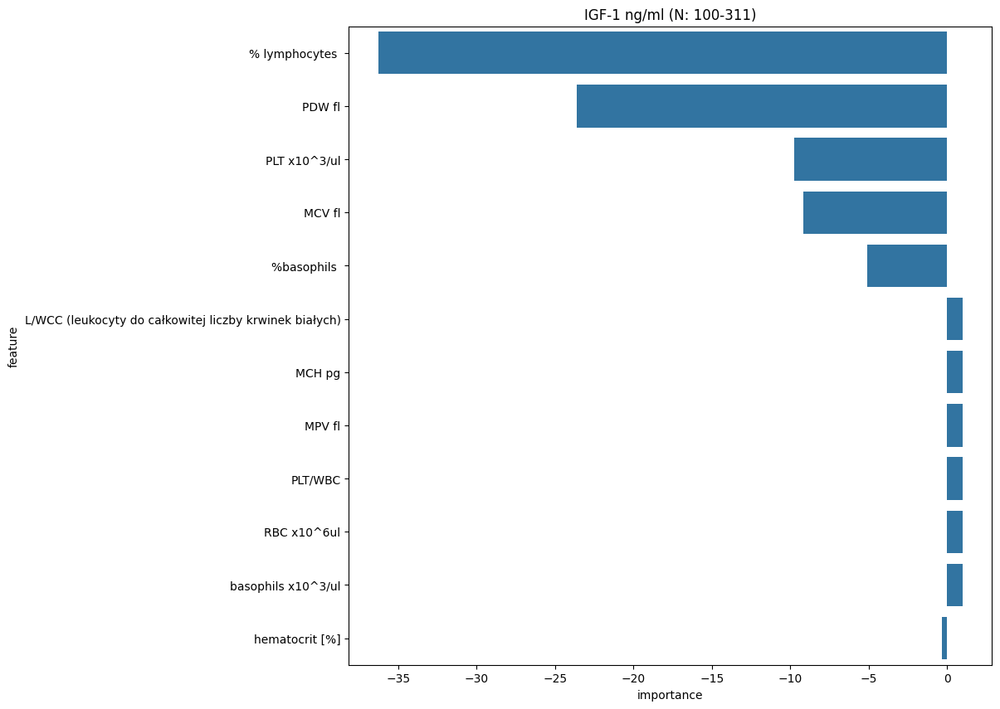

,model,data_set,mse,mae,rmse,r2
0,LinearRegression(),training,5561.444,59.580,74.575,0.060
1,LinearRegression(),test,7021.376,66.255,83.794,-0.037


In [24]:
lr_model = LinearRegression()

vit_d_model_scores_df, feature_importnces_lr = train_model(lr_model, IGF, X_train_igf[intersection_all_sets], y_train_igf, X_test_igf[intersection_all_sets], y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

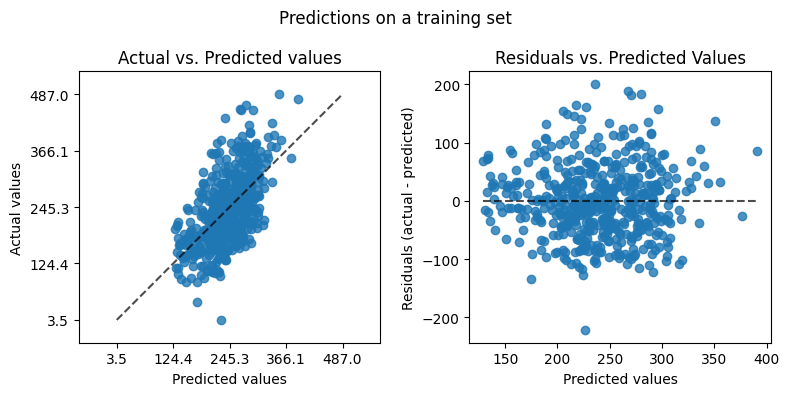

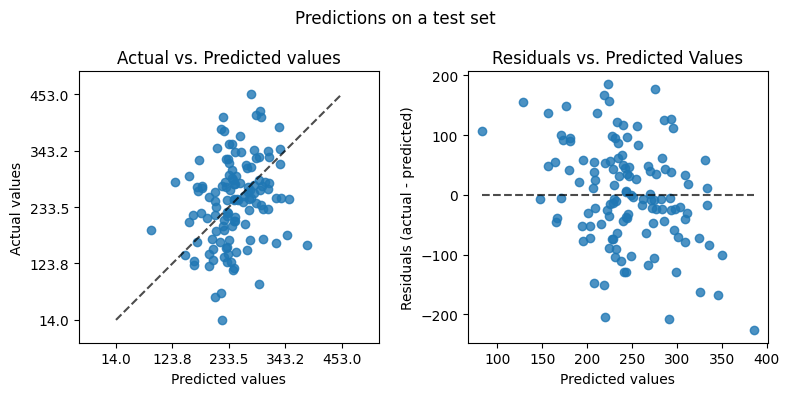

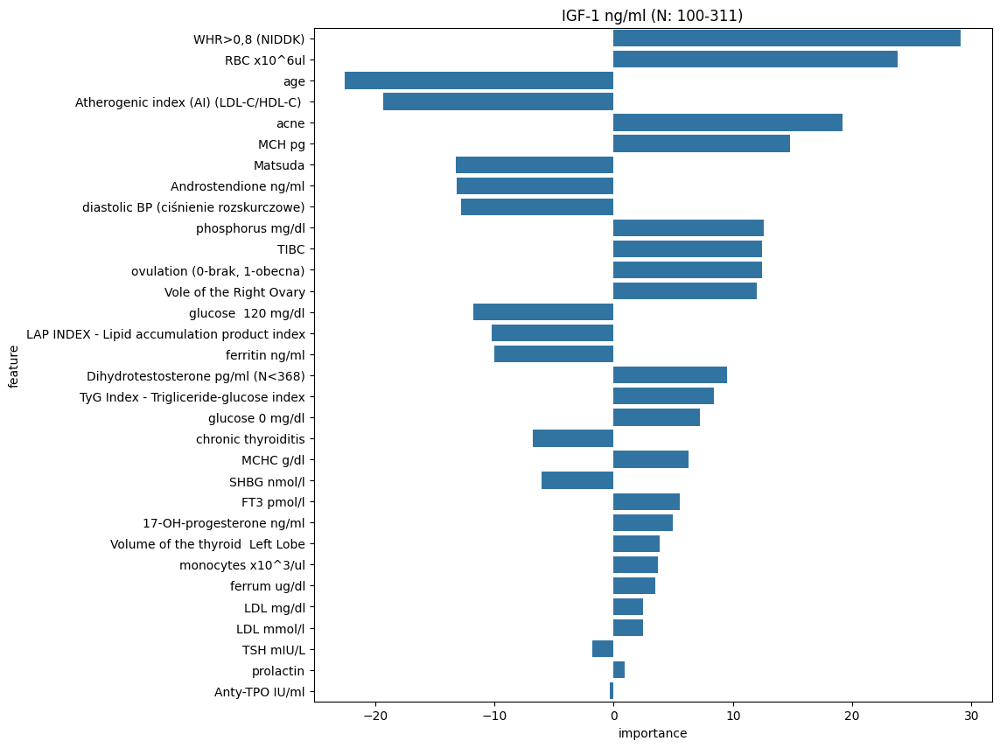

,model,data_set,mse,mae,rmse,r2
0,LinearRegression(),training,3835.463,49.077,61.931,0.352
1,LinearRegression(),test,7137.821,67.084,84.486,-0.055


In [22]:
lr_model = LinearRegression()

vit_d_model_scores_df, feature_importnces_lr = train_model(lr_model, IGF, X_train_igf[intersection_all_sets], y_train_igf, X_test_igf[intersection_all_sets], y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

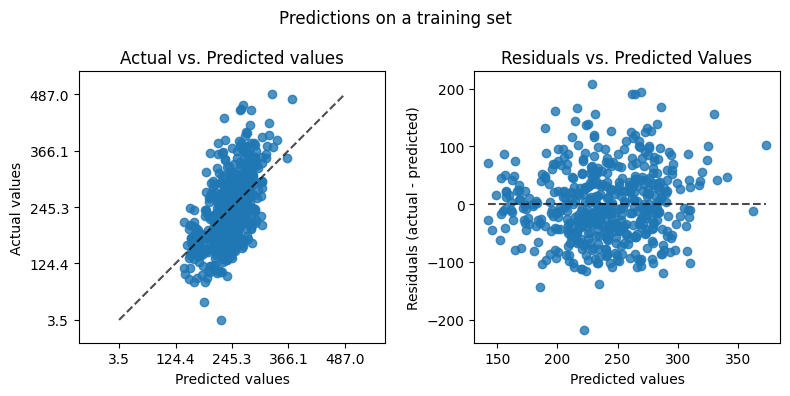

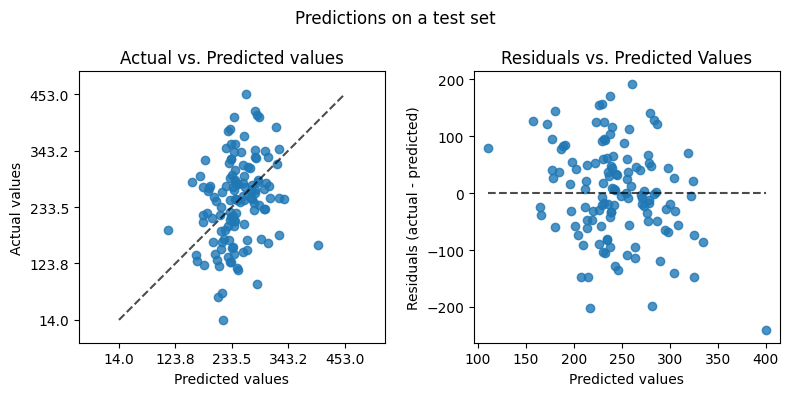

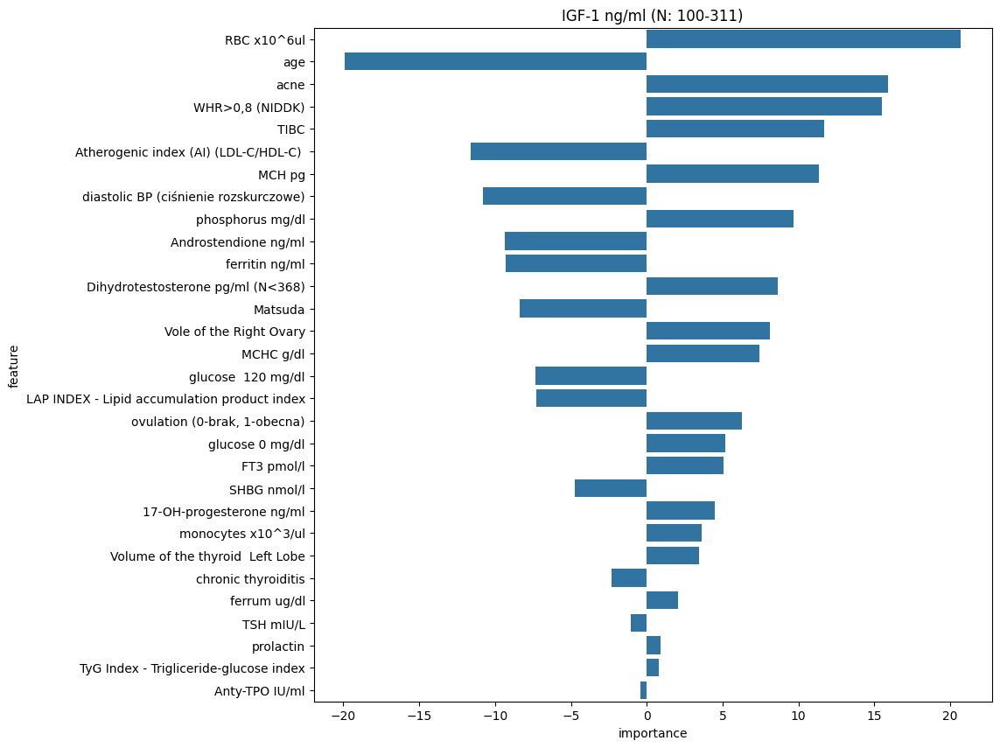

,model,data_set,mse,mae,rmse,r2
0,Lasso(alpha=1),training,3920.132,49.835,62.611,0.338
1,Lasso(alpha=1),test,6798.412,65.473,82.452,-0.004


In [23]:
lasso_model = Lasso(alpha=1)


vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, IGF, X_train_igf[intersection_all_sets], y_train_igf, X_test_igf[intersection_all_sets], y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

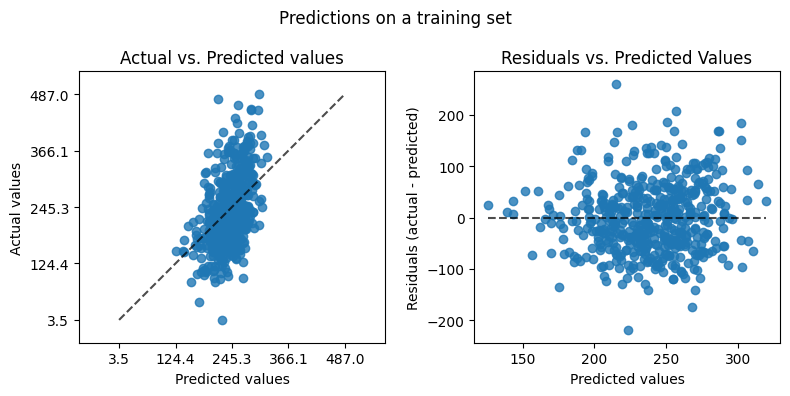

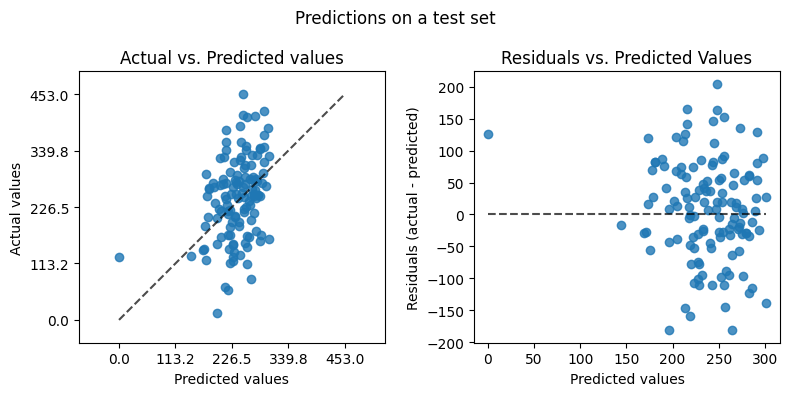

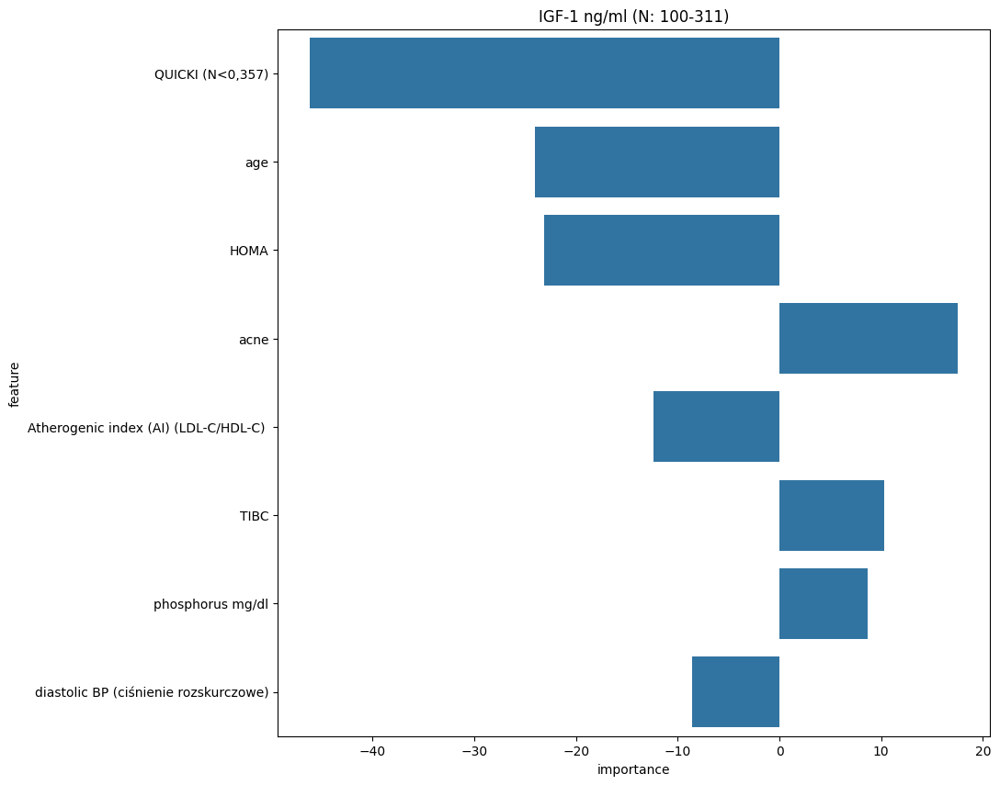

,model,data_set,mse,mae,rmse,r2
0,Lasso(alpha=1),training,4606.391,54.457,67.870,0.222
1,Lasso(alpha=1),test,6164.515,62.860,78.514,0.089


In [70]:
lasso_model = Lasso(alpha=1)

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, IGF, X_train_igf[intersection_all_sets], y_train_igf, X_test_igf[intersection_all_sets], y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

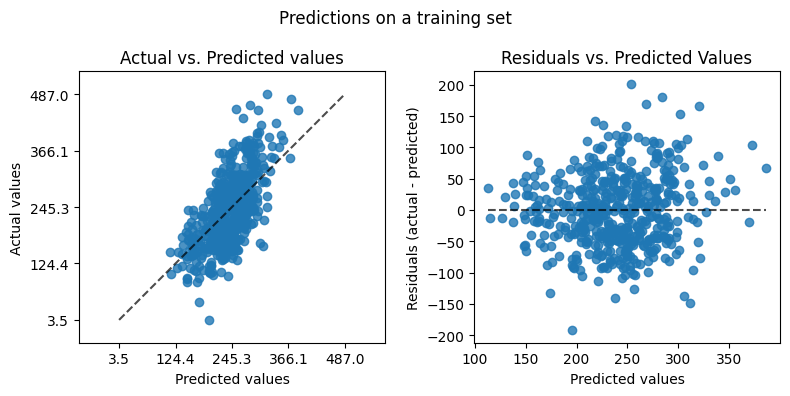

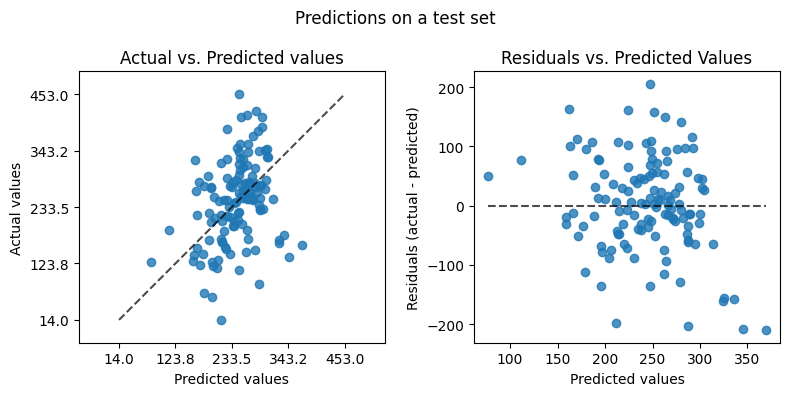

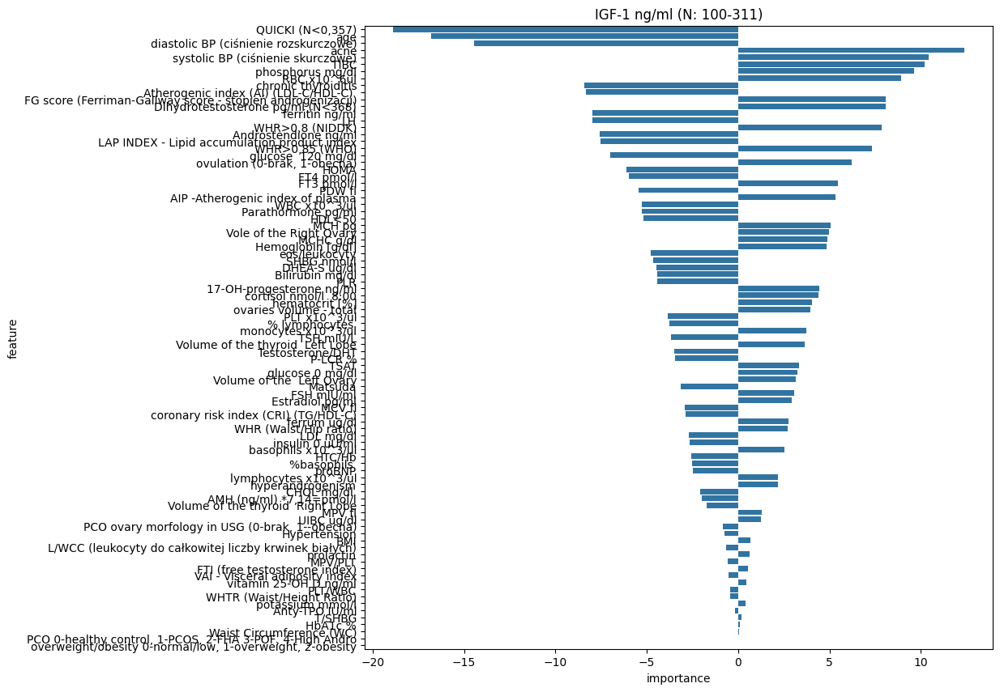

,model,data_set,mse,mae,rmse,r2
0,Ridge(alpha=50),training,3387.853,46.920,58.205,0.428
1,Ridge(alpha=50),test,6520.451,62.431,80.749,0.037


In [71]:
ridge_model = Ridge(alpha=50)

vit_d_model_scores_df, feature_importnces_ridge = train_model(ridge_model, IGF, X_train_igf[union_all_sets], y_train_igf, X_test_igf[union_all_sets], y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

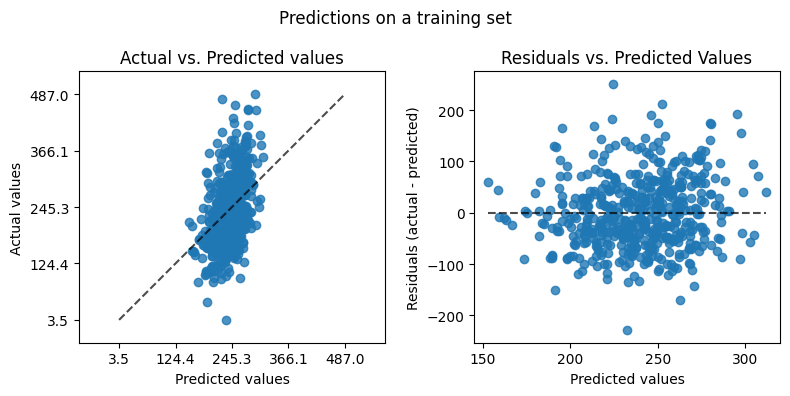

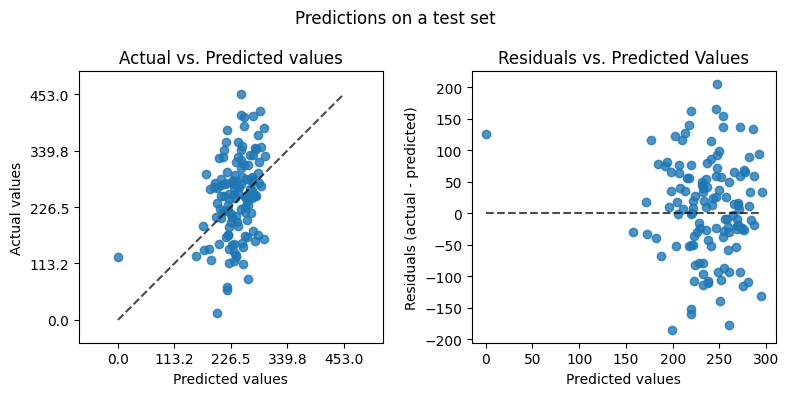

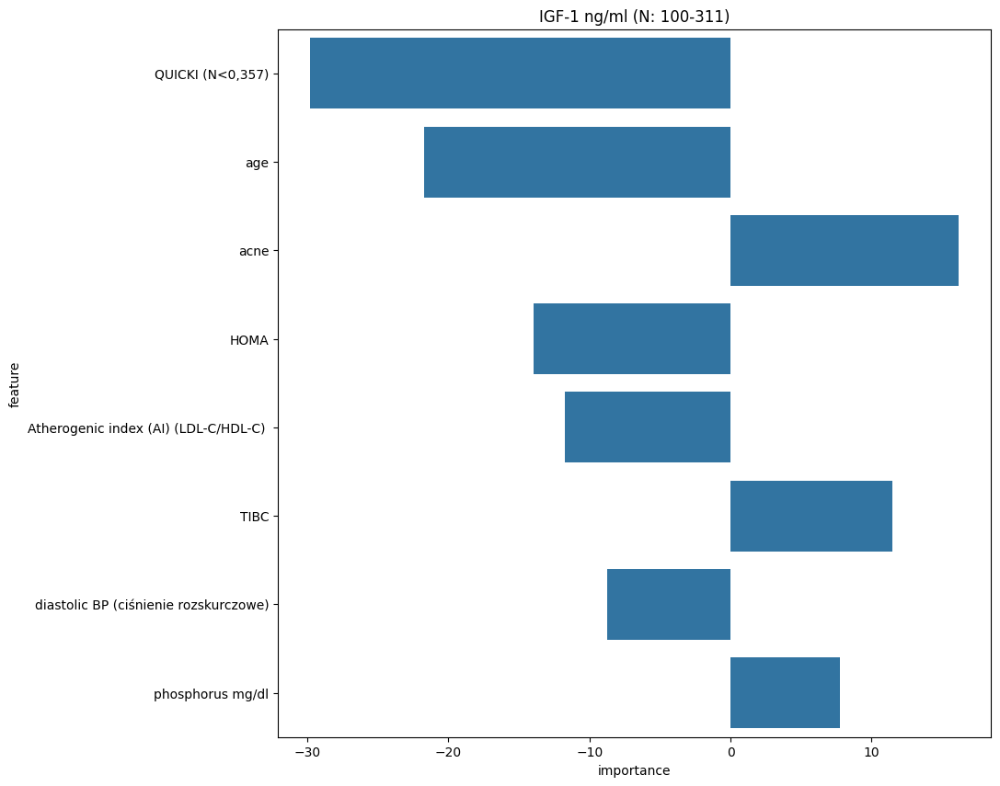

,model,data_set,mse,mae,rmse,r2
0,Ridge(alpha=50),training,4704.495,55.129,68.589,0.205
1,Ridge(alpha=50),test,6141.732,62.840,78.369,0.093


In [72]:
ridge_model = Ridge(alpha=50)

vit_d_model_scores_df, feature_importnces_ridge = train_model(ridge_model, IGF, X_train_igf[intersection_all_sets], y_train_igf, X_test_igf[intersection_all_sets], y_test_igf, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df